# Data Extraction

In [2]:
import pickle
import numpy as np
import pandas as pd
from pathlib import Path
from typing import Dict, List, Tuple
import warnings

warnings.filterwarnings('ignore')

# Configuration
RESULTS_DIR = "/home/groups/rxdh/optimize_obs_seq_N5M4"

# All files to load
# Format: (psi, theta, speaker_version)
FILE_CONFIGS = [
    # Informative
    ("inf", 0.4, "T"),
    ("inf", 0.4, "F"),
    ("inf", 0.6, "T"),
    ("inf", 0.6, "F"),
    # Persuade-up
    ("persp", 0.2, "T"),
    ("persp", 0.2, "F"),
    ("persp", 0.3, "T"),
    ("persp", 0.3, "F"),
    # Persuade-down
    ("persm", 0.7, "T"),
    ("persm", 0.7, "F"),
    ("persm", 0.8, "T"),
    ("persm", 0.8, "F"),
]

# Model names
ALL_MODELS = ["literal", "inf_T", "inf_F", "persp_T", "persp_F", "persm_T", "persm_F"]

FITTED_KEYS = {
    "literal": "literal_fitted",
    "inf_T": "inf_T_fitted",
    "inf_F": "inf_F_fitted",
    "persp_T": "persp_T_fitted",
    "persp_F": "persp_F_fitted",
    "persm_T": "persm_T_fitted",
    "persm_F": "persm_F_fitted",
}

# Define wrong-goal models for each speaker
# These are models with DIFFERENT psi (goal)
WRONG_GOAL_MODELS = {
    "inf_T": ["literal", "persp_T", "persp_F", "persm_T", "persm_F"],  # exclude inf_F (same goal)
    "inf_F": ["literal", "persp_T", "persp_F", "persm_T", "persm_F"],  # exclude inf_T (same goal)
    "persp_T": ["literal", "inf_T", "inf_F", "persm_T", "persm_F"],    # exclude persp_F
    "persp_F": ["literal", "inf_T", "inf_F", "persm_T", "persm_F"],    # exclude persp_T
    "persm_T": ["literal", "inf_T", "inf_F", "persp_T", "persp_F"],    # exclude persm_F
    "persm_F": ["literal", "inf_T", "inf_F", "persp_T", "persp_F"],    # exclude persm_T
}

# T=15 only
T = 15


def load_obs_data(filepath: Path) -> dict:
    """Load a pickle file."""
    with open(filepath, "rb") as f:
        return pickle.load(f)


def get_filepath(psi: str, theta: float, update: str) -> Path:
    """Construct filepath for a given (psi, theta, update)."""
    theta_str = str(theta).replace(".", "_")
    speaker = f"{psi}_{update}"
    filename = f"obs_seq_{speaker}_{theta_str}.pkl"
    return Path(RESULTS_DIR) / filename


# Load all files
print("\nLoading data files...")
all_data = {}

for psi, theta, update in FILE_CONFIGS:
    filepath = get_filepath(psi, theta, update)
    key = (psi, theta, update)
    
    print(f"  Loading {filepath.name}...", end=" ")
    
    if filepath.exists():
        all_data[key] = load_obs_data(filepath)
        n_obs = len(all_data[key]["observations"][theta])
        print(f"OK ({n_obs} obs_seq)")
    else:
        print(f"NOT FOUND!")
        all_data[key] = None

print(f"\nLoaded {sum(1 for v in all_data.values() if v is not None)}/{len(FILE_CONFIGS)} files")


Loading data files...
  Loading obs_seq_inf_T_0_4.pkl... OK (1000 obs_seq)
  Loading obs_seq_inf_F_0_4.pkl... OK (1000 obs_seq)
  Loading obs_seq_inf_T_0_6.pkl... OK (1000 obs_seq)
  Loading obs_seq_inf_F_0_6.pkl... OK (1000 obs_seq)
  Loading obs_seq_persp_T_0_2.pkl... OK (1000 obs_seq)
  Loading obs_seq_persp_F_0_2.pkl... OK (1000 obs_seq)
  Loading obs_seq_persp_T_0_3.pkl... OK (1000 obs_seq)
  Loading obs_seq_persp_F_0_3.pkl... OK (1000 obs_seq)
  Loading obs_seq_persm_T_0_7.pkl... OK (1000 obs_seq)
  Loading obs_seq_persm_F_0_7.pkl... OK (1000 obs_seq)
  Loading obs_seq_persm_T_0_8.pkl... OK (1000 obs_seq)
  Loading obs_seq_persm_F_0_8.pkl... OK (1000 obs_seq)

Loaded 12/12 files


In [3]:
all_data.keys()

dict_keys([('inf', 0.4, 'T'), ('inf', 0.4, 'F'), ('inf', 0.6, 'T'), ('inf', 0.6, 'F'), ('persp', 0.2, 'T'), ('persp', 0.2, 'F'), ('persp', 0.3, 'T'), ('persp', 0.3, 'F'), ('persm', 0.7, 'T'), ('persm', 0.7, 'F'), ('persm', 0.8, 'T'), ('persm', 0.8, 'F')])

In [4]:
def extract_obs_seq_data(
    obs_data: dict,
    psi: str,
    theta: float,
    update: str,  # "T" or "F"
) -> pd.DataFrame:
    """
    Extract observation-level data from a single file.
    
    For each obs_seq:
    - Observation likelihood
    - Mean ll_gap against each wrong model (averaged over utterances)
    - The actual observation sequence itself
    
    Returns DataFrame with one row per obs_seq.
    """
    
    speaker_key = f"{psi}_{update}"  # e.g., "inf_T"
    true_fitted_key = FITTED_KEYS[speaker_key]
    
    observations = obs_data["observations"][theta]
    
    rows = []
    
    for obs_info in observations:
        obs_id = obs_info["obs_idx"]
        
        # Get observation sequence likelihood
        obs_log_lik = obs_info.get("log_lik_true_theta", {}).get(T, np.nan)
        
        # Get the observation sequence itself (for later reference)
        obs_seq = obs_info.get("obs_seq", None)
        
        # Get utterances for this speaker
        alpha = 4.0 if psi != "literal" else 0.0
        
        if "utterances" not in obs_info or speaker_key not in obs_info["utterances"]:
            continue
        
        utt_records = obs_info["utterances"][speaker_key].get(alpha, [])
        
        if len(utt_records) == 0:
            continue
        
        # Compute mean fitted_ll for each model across all utterances
        model_lls = {model: [] for model in ALL_MODELS}
        
        for utt_rec in utt_records:
            fitted_lls = utt_rec.get("log_lik_all_speaker", {})
            
            for model in ALL_MODELS:
                fitted_key = FITTED_KEYS[model]
                ll = fitted_lls.get(fitted_key, {}).get("max_log_lik", {}).get(T, np.nan)
                model_lls[model].append(ll)
        
        # Compute means
        mean_lls = {model: np.nanmean(lls) for model, lls in model_lls.items()}
        
        # Get true model ll
        true_ll = mean_lls[speaker_key]
        
        # Compute ll_gap against each wrong model
        ll_gaps = {}
        for model in ALL_MODELS:
            if model == speaker_key:
                continue
            ll_gaps[model] = true_ll - mean_lls[model]
        
        # Compute aggregate metrics
        all_wrong_gaps = [ll_gaps[m] for m in ALL_MODELS if m != speaker_key]
        min_all = np.min(all_wrong_gaps) if all_wrong_gaps else np.nan
        
        wrong_goal = WRONG_GOAL_MODELS[speaker_key]
        wrong_goal_gaps = [ll_gaps[m] for m in wrong_goal]
        min_goal = np.min(wrong_goal_gaps) if wrong_goal_gaps else np.nan
        
        # Store row - NOW INCLUDING obs_seq
        row = {
            "psi": psi,
            "theta": theta,
            "update": update,
            "speaker": speaker_key,
            "obs_id": obs_id,
            "obs_seq": obs_seq,  # <-- THE ACTUAL OBSERVATION SEQUENCE
            "obs_log_lik": obs_log_lik,
            "n_utterances": len(utt_records),
            "true_model_ll": true_ll,
            "min_ll_gap_all": min_all,
            "min_ll_gap_goal": min_goal,
        }
        
        # Add individual ll_gaps
        for model, gap in ll_gaps.items():
            row[f"ll_gap_{model}"] = gap
        
        # Add individual mean lls (for debugging)
        for model, ll in mean_lls.items():
            row[f"mean_ll_{model}"] = ll
        
        rows.append(row)
    
    return pd.DataFrame(rows)

In [5]:
# Extract data from all files
print("\nExtracting observation-level data...")

all_dfs = []

for psi, theta, update in FILE_CONFIGS:
    key = (psi, theta, update)
    
    if all_data[key] is None:
        print(f"  Skipping {psi}_{update} theta={theta} (no data)")
        continue
    
    print(f"  Processing {psi}_{update} theta={theta}...", end=" ")
    
    df = extract_obs_seq_data(all_data[key], psi, theta, update)
    all_dfs.append(df)
    
    print(f"{len(df)} obs_seq")

# Combine all
df_all = pd.concat(all_dfs, ignore_index=True)

print(f"\nTotal records: {len(df_all)}")
print(f"Columns: {df_all.columns.tolist()}")


Extracting observation-level data...
  Processing inf_T theta=0.4... 1000 obs_seq
  Processing inf_F theta=0.4... 1000 obs_seq
  Processing inf_T theta=0.6... 1000 obs_seq
  Processing inf_F theta=0.6... 1000 obs_seq
  Processing persp_T theta=0.2... 1000 obs_seq
  Processing persp_F theta=0.2... 1000 obs_seq
  Processing persp_T theta=0.3... 1000 obs_seq
  Processing persp_F theta=0.3... 1000 obs_seq
  Processing persm_T theta=0.7... 1000 obs_seq
  Processing persm_F theta=0.7... 1000 obs_seq
  Processing persm_T theta=0.8... 1000 obs_seq
  Processing persm_F theta=0.8... 1000 obs_seq

Total records: 12000
Columns: ['psi', 'theta', 'update', 'speaker', 'obs_id', 'obs_seq', 'obs_log_lik', 'n_utterances', 'true_model_ll', 'min_ll_gap_all', 'min_ll_gap_goal', 'll_gap_literal', 'll_gap_inf_F', 'll_gap_persp_T', 'll_gap_persp_F', 'll_gap_persm_T', 'll_gap_persm_F', 'mean_ll_literal', 'mean_ll_inf_T', 'mean_ll_inf_F', 'mean_ll_persp_T', 'mean_ll_persp_F', 'mean_ll_persm_T', 'mean_ll_persm_

In [6]:
def pair_T_F_data(df: pd.DataFrame) -> pd.DataFrame:
    """
    Pair T and F data for the same observation sequences.
    
    Since T and F files with same seed and theta have identical obs_seq,
    we can join them by (psi, theta, obs_id).
    
    Returns DataFrame with one row per observation sequence,
    containing metrics from both T and F.
    """
    
    # Split into T and F
    df_T = df[df["update"] == "T"].copy()
    df_F = df[df["update"] == "F"].copy()
    
    # Rename columns for merge
    cols_to_rename_T = {
        "speaker": "speaker_T",
        "obs_log_lik": "obs_log_lik",  # Same for both
        "obs_seq": "obs_seq",  # <-- KEEP obs_seq (same for T and F)
        "n_utterances": "n_utterances_T",
        "true_model_ll": "true_model_ll_T",
        "min_ll_gap_all": "min_ll_gap_all_T",
        "min_ll_gap_goal": "min_ll_gap_goal_T",
    }
    
    cols_to_rename_F = {
        "speaker": "speaker_F",
        "n_utterances": "n_utterances_F",
        "true_model_ll": "true_model_ll_F",
        "min_ll_gap_all": "min_ll_gap_all_F",
        "min_ll_gap_goal": "min_ll_gap_goal_F",
    }
    
    # Add ll_gap columns
    for col in df_T.columns:
        if col.startswith("ll_gap_"):
            model = col.replace("ll_gap_", "")
            cols_to_rename_T[col] = f"ll_gap_{model}_T"
    
    for col in df_F.columns:
        if col.startswith("ll_gap_"):
            model = col.replace("ll_gap_", "")
            cols_to_rename_F[col] = f"ll_gap_{model}_F"
    
    # Select and rename columns
    merge_cols = ["psi", "theta", "obs_id"]
    
    df_T_renamed = df_T[merge_cols + list(cols_to_rename_T.keys())].rename(columns=cols_to_rename_T)
    df_F_renamed = df_F[merge_cols + list(cols_to_rename_F.keys())].rename(columns=cols_to_rename_F)
    
    # Remove obs_log_lik and obs_seq from F (they're the same as T)
    df_F_renamed = df_F_renamed.drop(columns=["obs_log_lik", "obs_seq"], errors="ignore")
    
    # Merge
    df_paired = df_T_renamed.merge(df_F_renamed, on=merge_cols, how="inner")
    
    return df_paired

In [7]:
df_paired = pair_T_F_data(df_all)

print(f"\nPaired data shape: {df_paired.shape}")
print(f"Columns: {df_paired.columns.tolist()}")

# Verify pairing
print(f"\nVerification:")
for psi in df_paired["psi"].unique():
    for theta in df_paired[df_paired["psi"] == psi]["theta"].unique():
        n = len(df_paired[(df_paired["psi"] == psi) & (df_paired["theta"] == theta)])
        print(f"  {psi}, theta={theta}: {n} obs_seq")


Paired data shape: (6000, 29)
Columns: ['psi', 'theta', 'obs_id', 'speaker_T', 'obs_log_lik', 'obs_seq', 'n_utterances_T', 'true_model_ll_T', 'min_ll_gap_all_T', 'min_ll_gap_goal_T', 'll_gap_literal_T', 'll_gap_inf_F_T', 'll_gap_persp_T_T', 'll_gap_persp_F_T', 'll_gap_persm_T_T', 'll_gap_persm_F_T', 'll_gap_inf_T_T', 'speaker_F', 'n_utterances_F', 'true_model_ll_F', 'min_ll_gap_all_F', 'min_ll_gap_goal_F', 'll_gap_literal_F', 'll_gap_inf_F_F', 'll_gap_persp_T_F', 'll_gap_persp_F_F', 'll_gap_persm_T_F', 'll_gap_persm_F_F', 'll_gap_inf_T_F']

Verification:
  inf, theta=0.4: 1000 obs_seq
  inf, theta=0.6: 1000 obs_seq
  persp, theta=0.2: 1000 obs_seq
  persp, theta=0.3: 1000 obs_seq
  persm, theta=0.7: 1000 obs_seq
  persm, theta=0.8: 1000 obs_seq


In [8]:
def harmonic_mean(a: float, b: float) -> float:
    """Compute harmonic mean of two positive values."""
    if a <= 0 or b <= 0:
        raise ValueError(
            f"Harmonic mean is only defined for positive values; got a={a}, b={b}"
        )
    return 2 * a * b / (a + b)


def compute_combined_metrics(df: pd.DataFrame) -> pd.DataFrame:
    """
    Compute combined T+F metrics for each observation sequence.
    
    Adds columns:
    - min_ll_gap_all_min: min(T, F) for all wrong models
    - min_ll_gap_all_mean: mean(T, F) for all wrong models
    - min_ll_gap_all_harmonic: harmonic_mean(T, F) for all wrong models
    - min_ll_gap_goal_min: min(T, F) for wrong-goal models
    - min_ll_gap_goal_mean: mean(T, F) for wrong-goal models
    - min_ll_gap_goal_harmonic: harmonic_mean(T, F) for wrong-goal models
    """
    
    df = df.copy()
    
    # Combined metrics for ALL wrong models
    df["min_ll_gap_all_min"] = df[["min_ll_gap_all_T", "min_ll_gap_all_F"]].min(axis=1)
    df["min_ll_gap_all_mean"] = df[["min_ll_gap_all_T", "min_ll_gap_all_F"]].mean(axis=1)
    df["min_ll_gap_all_harmonic"] = df.apply(
        lambda row: harmonic_mean(row["min_ll_gap_all_T"], row["min_ll_gap_all_F"]), axis=1
    )
    
    # Combined metrics for wrong-GOAL models only
    df["min_ll_gap_goal_min"] = df[["min_ll_gap_goal_T", "min_ll_gap_goal_F"]].min(axis=1)
    df["min_ll_gap_goal_mean"] = df[["min_ll_gap_goal_T", "min_ll_gap_goal_F"]].mean(axis=1)
    df["min_ll_gap_goal_harmonic"] = df.apply(
        lambda row: harmonic_mean(row["min_ll_gap_goal_T"], row["min_ll_gap_goal_F"]), axis=1
    )
    
    return df

In [9]:
df_combined = compute_combined_metrics(df_paired)
print("\nCombined metrics added.")
print(f"Columns: {df_combined.columns.tolist()}")


Combined metrics added.
Columns: ['psi', 'theta', 'obs_id', 'speaker_T', 'obs_log_lik', 'obs_seq', 'n_utterances_T', 'true_model_ll_T', 'min_ll_gap_all_T', 'min_ll_gap_goal_T', 'll_gap_literal_T', 'll_gap_inf_F_T', 'll_gap_persp_T_T', 'll_gap_persp_F_T', 'll_gap_persm_T_T', 'll_gap_persm_F_T', 'll_gap_inf_T_T', 'speaker_F', 'n_utterances_F', 'true_model_ll_F', 'min_ll_gap_all_F', 'min_ll_gap_goal_F', 'll_gap_literal_F', 'll_gap_inf_F_F', 'll_gap_persp_T_F', 'll_gap_persp_F_F', 'll_gap_persm_T_F', 'll_gap_persm_F_F', 'll_gap_inf_T_F', 'min_ll_gap_all_min', 'min_ll_gap_all_mean', 'min_ll_gap_all_harmonic', 'min_ll_gap_goal_min', 'min_ll_gap_goal_mean', 'min_ll_gap_goal_harmonic']


In [10]:
def compute_per_model_combined_metrics(df: pd.DataFrame) -> pd.DataFrame:
    """
    For each wrong model, compute combined T+F metrics.
    
    This allows us to see which specific comparison is the bottleneck.
    """
    
    df = df.copy()
    
    # Get all wrong model columns from T
    wrong_models = [c.replace("ll_gap_", "").replace("_T", "") 
                    for c in df.columns if c.startswith("ll_gap_") and c.endswith("_T")]
    
    for model in wrong_models:
        col_T = f"ll_gap_{model}_T"
        col_F = f"ll_gap_{model}_F"
        
        if col_T in df.columns and col_F in df.columns:
            # Min across T and F
            df[f"ll_gap_{model}_min"] = df[[col_T, col_F]].min(axis=1)
            # Harmonic mean
            df[f"ll_gap_{model}_harmonic"] = df.apply(
                lambda row: harmonic_mean(row[col_T], row[col_F]) 
                if pd.notna(row[col_T]) and pd.notna(row[col_F]) else np.nan, 
                axis=1
            )
    
    return df

In [11]:
df_combined = compute_per_model_combined_metrics(df_combined)

print("\nPer-model combined metrics added.")
print(f"Columns: {df_combined.columns.tolist()}")


Per-model combined metrics added.
Columns: ['psi', 'theta', 'obs_id', 'speaker_T', 'obs_log_lik', 'obs_seq', 'n_utterances_T', 'true_model_ll_T', 'min_ll_gap_all_T', 'min_ll_gap_goal_T', 'll_gap_literal_T', 'll_gap_inf_F_T', 'll_gap_persp_T_T', 'll_gap_persp_F_T', 'll_gap_persm_T_T', 'll_gap_persm_F_T', 'll_gap_inf_T_T', 'speaker_F', 'n_utterances_F', 'true_model_ll_F', 'min_ll_gap_all_F', 'min_ll_gap_goal_F', 'll_gap_literal_F', 'll_gap_inf_F_F', 'll_gap_persp_T_F', 'll_gap_persp_F_F', 'll_gap_persm_T_F', 'll_gap_persm_F_F', 'll_gap_inf_T_F', 'min_ll_gap_all_min', 'min_ll_gap_all_mean', 'min_ll_gap_all_harmonic', 'min_ll_gap_goal_min', 'min_ll_gap_goal_mean', 'min_ll_gap_goal_harmonic', 'll_gap_literal_min', 'll_gap_literal_harmonic', 'll_gap_inf_F_min', 'll_gap_inf_F_harmonic', 'll_gap_persp_F_min', 'll_gap_persp_F_harmonic', 'll_gap_persm_F_min', 'll_gap_persm_F_harmonic']


In [12]:
# Select key columns for the final output
output_cols = [
    # Identifiers
    "psi", "theta", "obs_id", "obs_seq",
    
    # Observation likelihood
    "obs_log_lik",
    
    # Individual version metrics
    "min_ll_gap_all_T", "min_ll_gap_all_F",
    "min_ll_gap_goal_T", "min_ll_gap_goal_F",
    
    # Combined metrics (all wrong models)
    "min_ll_gap_all_min", "min_ll_gap_all_mean", "min_ll_gap_all_harmonic",
    
    # Combined metrics (wrong-goal only)
    "min_ll_gap_goal_min", "min_ll_gap_goal_mean", "min_ll_gap_goal_harmonic",
]

df_output = df_combined[output_cols].copy()

print(f"\nColumns:\n{df_output.columns.tolist()}")


Columns:
['psi', 'theta', 'obs_id', 'obs_seq', 'obs_log_lik', 'min_ll_gap_all_T', 'min_ll_gap_all_F', 'min_ll_gap_goal_T', 'min_ll_gap_goal_F', 'min_ll_gap_all_min', 'min_ll_gap_all_mean', 'min_ll_gap_all_harmonic', 'min_ll_gap_goal_min', 'min_ll_gap_goal_mean', 'min_ll_gap_goal_harmonic']


In [13]:
df_output.head(5)

,psi,theta,obs_id,obs_seq,obs_log_lik,min_ll_gap_all_T,min_ll_gap_all_F,min_ll_gap_goal_T,min_ll_gap_goal_F,min_ll_gap_all_min,min_ll_gap_all_mean,min_ll_gap_all_harmonic,min_ll_gap_goal_min,min_ll_gap_goal_mean,min_ll_gap_goal_harmonic
0,inf,0.4,0,"[(1, 2, 2, 0, 0), (0, 3, 2, 0, 0), (1, 3, 1, 0...",-51.842622,8.209583,5.553988,14.908535,5.553988,5.553988,6.881785,6.625595,5.553988,10.231261,8.093021
1,inf,0.4,1,"[(1, 1, 3, 0, 0), (0, 1, 1, 2, 1), (0, 0, 3, 2...",-54.916444,2.593052,1.994893,17.597443,7.039455,1.994893,2.293973,2.254980,7.039455,12.318449,10.056169
2,inf,0.4,2,"[(0, 1, 3, 1, 0), (0, 2, 2, 1, 0), (0, 3, 1, 1...",-50.508444,6.536436,4.635824,12.318438,4.635824,4.635824,5.586130,5.424465,4.635824,8.477131,6.736490
3,inf,0.4,3,"[(1, 1, 1, 2, 0), (1, 0, 3, 1, 0), (1, 2, 2, 0...",-51.842622,8.044190,1.839438,11.286119,1.839438,1.839438,4.941814,2.994202,1.839438,6.562778,3.163312
4,inf,0.4,4,"[(2, 1, 1, 1, 0), (0, 1, 2, 2, 0), (0, 2, 2, 1...",-54.734123,5.146806,5.285077,13.867911,5.963495,5.146806,5.215942,5.215025,5.963495,9.915703,8.340429


# Analyze

## Before combining

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

def plot_value_comparisons_by_theta_psi(df, rank=False):
    """
    Plots scatter comparisons of columns grouped by 'psi' and 'theta'.
    If rank=True, x and y values are converted to ranks before plotting.
    """

    grouped = df.groupby(["psi", "theta"])

    comparisons = [
        ("min_ll_gap_all_T", "min_ll_gap_all_F", "ALL gaps: T vs F"),
        ("min_ll_gap_goal_T", "min_ll_gap_goal_F", "GOAL gaps: T vs F"),
        ("min_ll_gap_all_T", "min_ll_gap_goal_T", "T speaker: ALL vs GOAL"),
        ("min_ll_gap_all_F", "min_ll_gap_goal_F", "F speaker: ALL vs GOAL"),
    ]

    for (psi, theta), group in grouped:
        fig, axes = plt.subplots(2, 2, figsize=(12, 10))
        axes = axes.flatten()

        for ax, (xcol, ycol, title) in zip(axes, comparisons):
            data = group[[xcol, ycol]].dropna()

            if len(data) < 2:
                ax.set_title(title + "\n(insufficient data)")
                continue

            x = data[xcol].values
            y = data[ycol].values

            if rank:
                # Convert to ranks
                x = np.argsort(np.argsort(x))
                y = np.argsort(np.argsort(y))

            # Scatter
            ax.scatter(x, y, alpha=0.6)

            # y = x reference
            min_val = min(x.min(), y.min())
            max_val = max(x.max(), y.max())
            ax.plot([min_val, max_val], [min_val, max_val], linestyle="--", label="y = x")

            # Linear fit
            slope, intercept = np.polyfit(x, y, 1)
            xs = np.linspace(min_val, max_val, 100)
            ax.plot(xs, slope * xs + intercept, label="fit")

            # Pearson correlation
            r, p = pearsonr(x, y)

            ax.set_title(title)
            ax.set_xlabel(xcol)
            ax.set_ylabel(ycol)
            ax.legend()
            ax.text(0.05, 0.95, f"r = {r:.2f}\np = {p:.2g}", transform=ax.transAxes, va="top")

        fig.suptitle(f"Psi = {psi}, Theta = {theta}", fontsize=14)
        plt.tight_layout()
        plt.show()

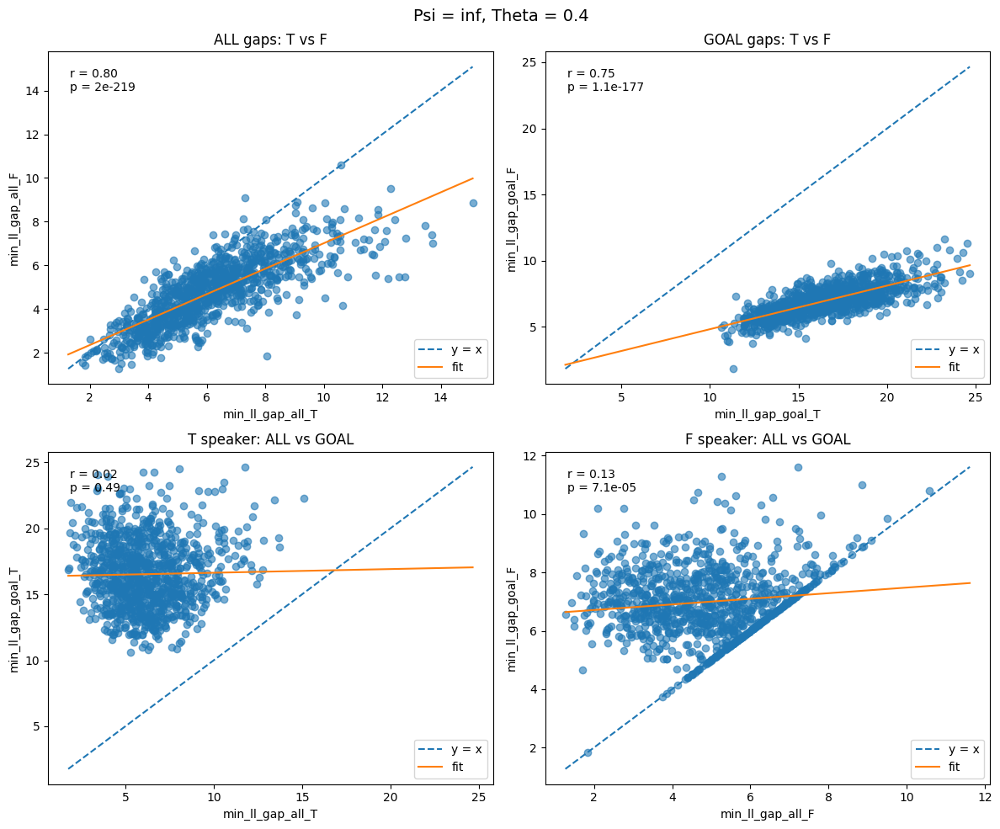

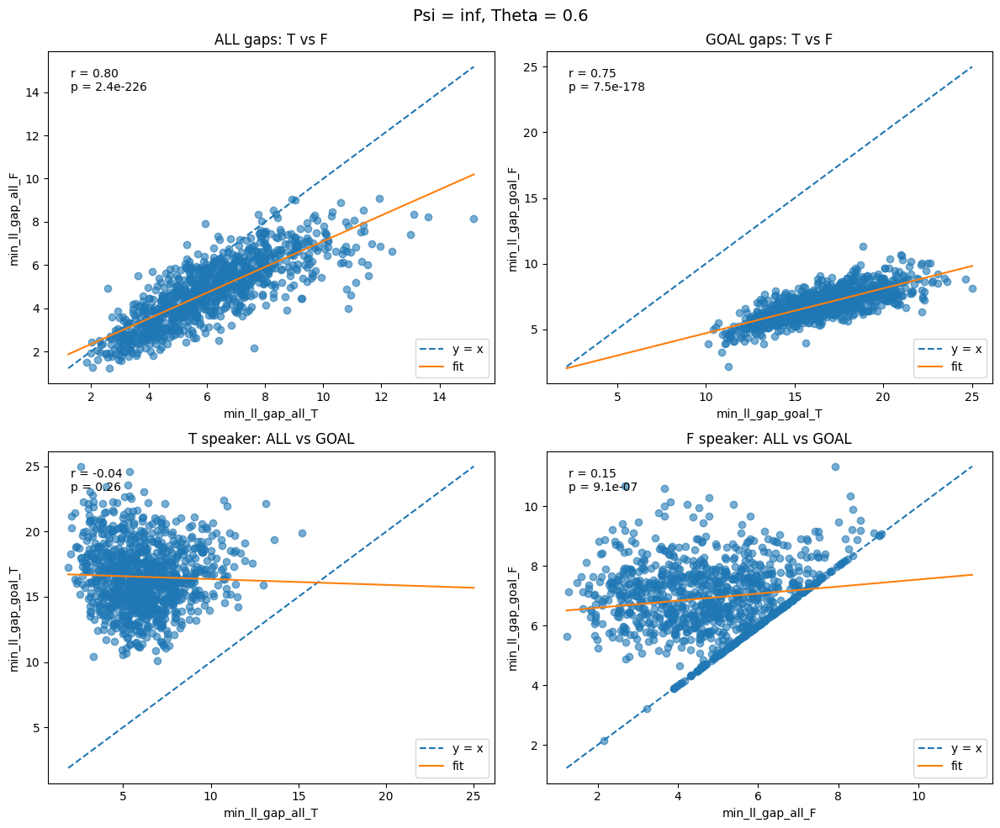

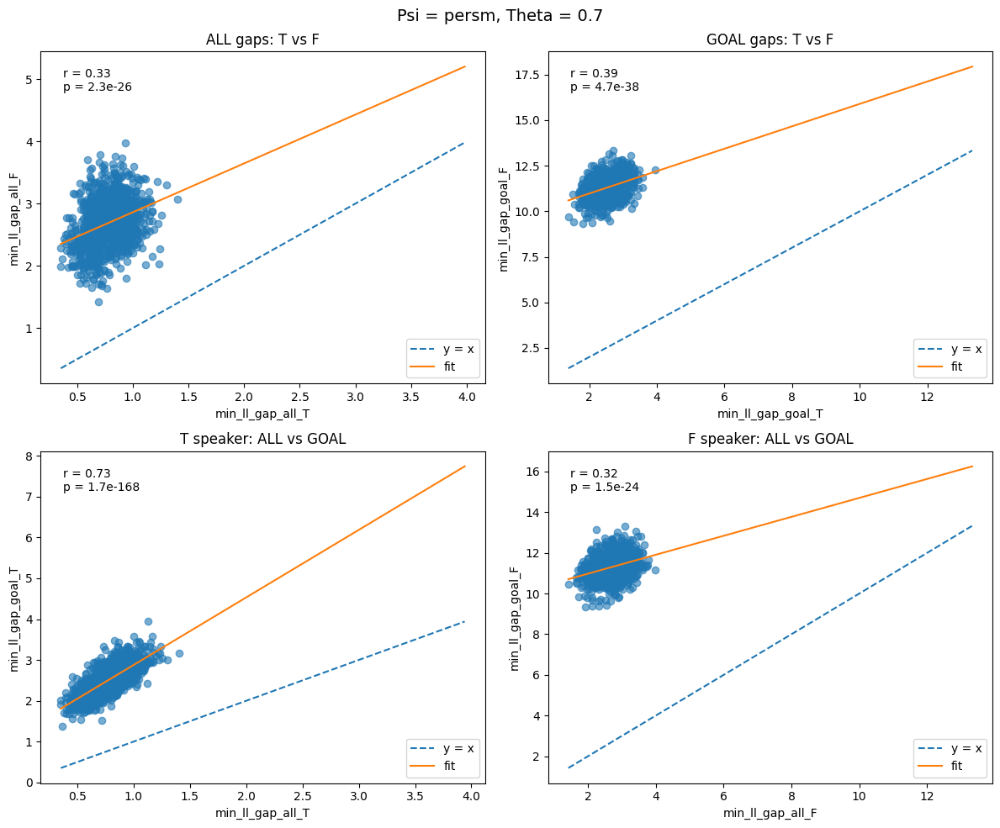

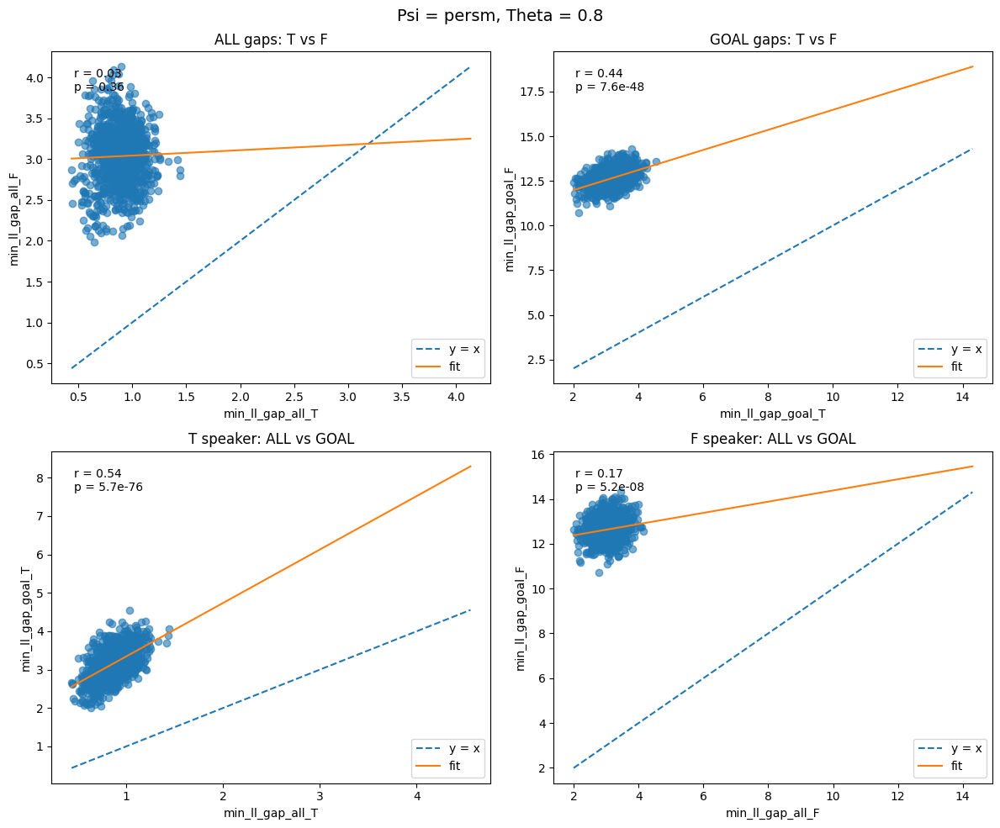

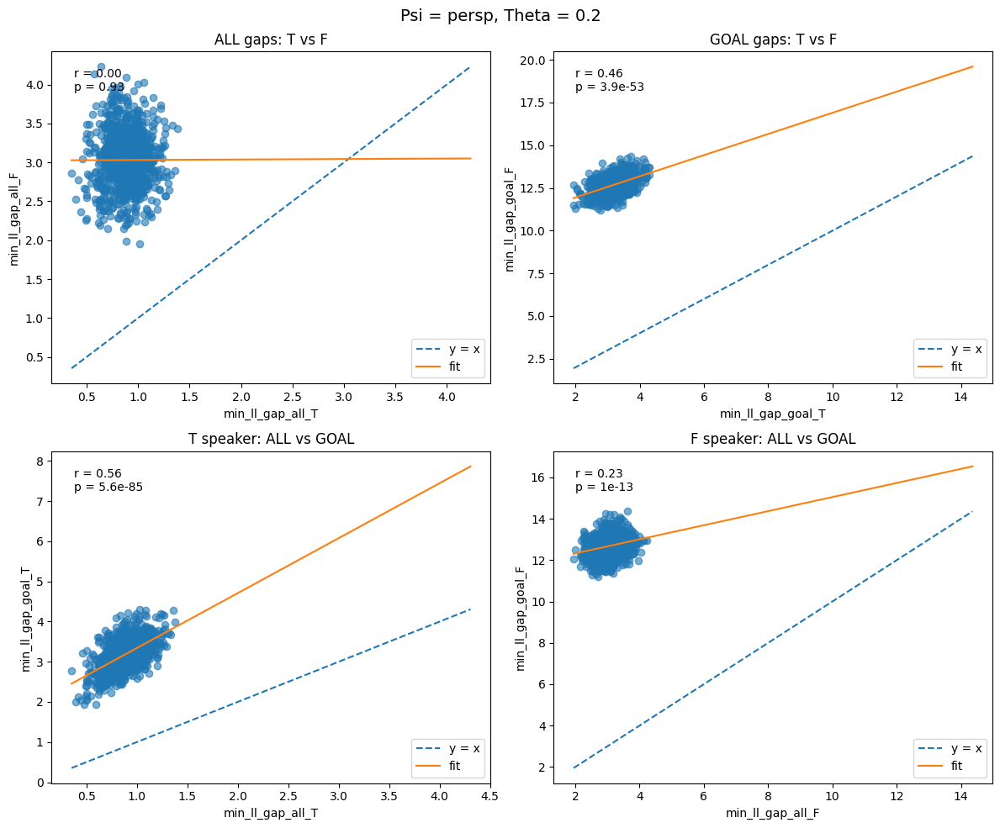

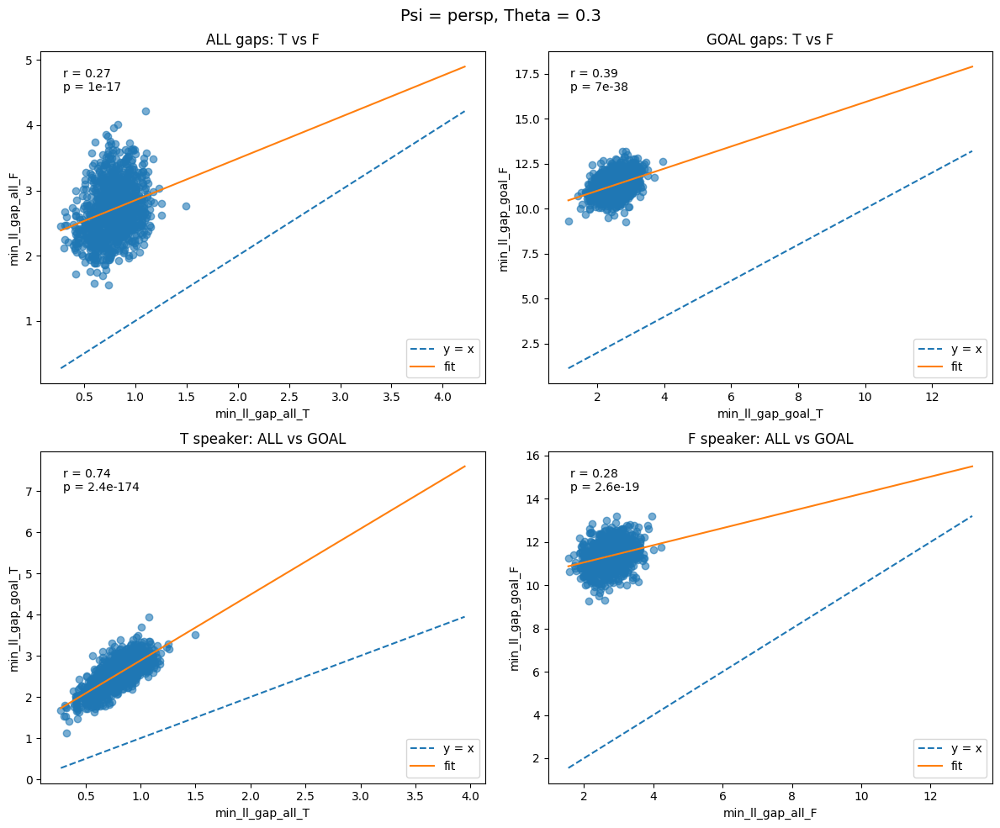

In [15]:
plot_value_comparisons_by_theta_psi(df_output)

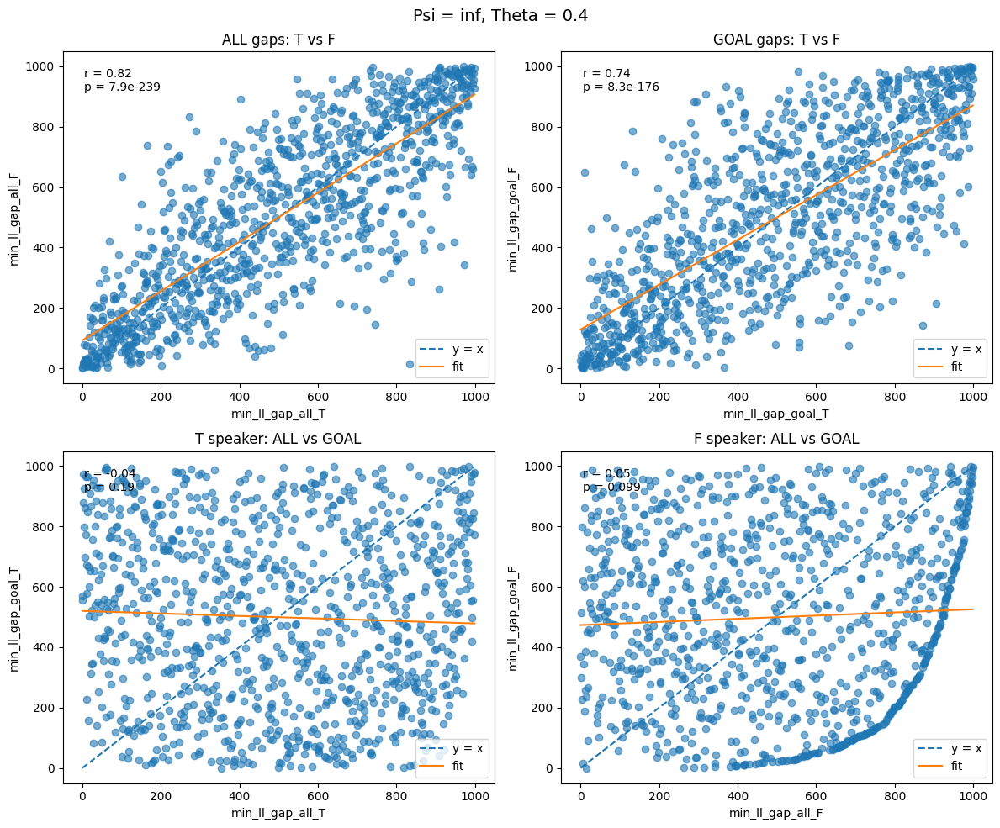

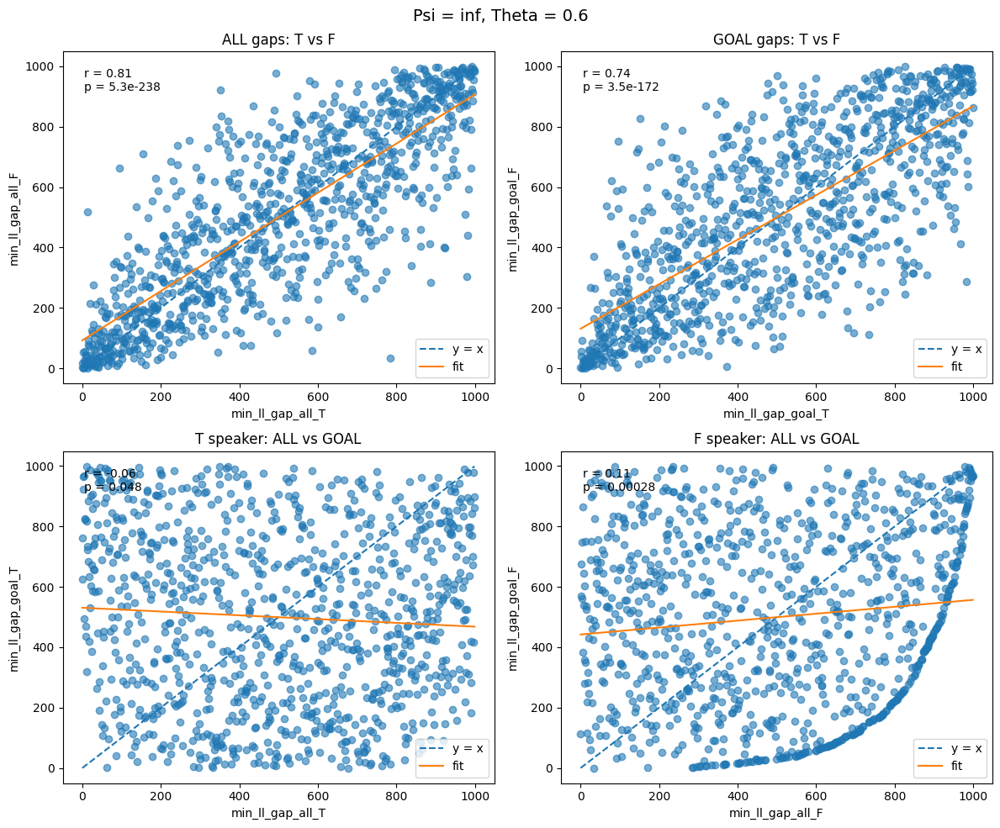

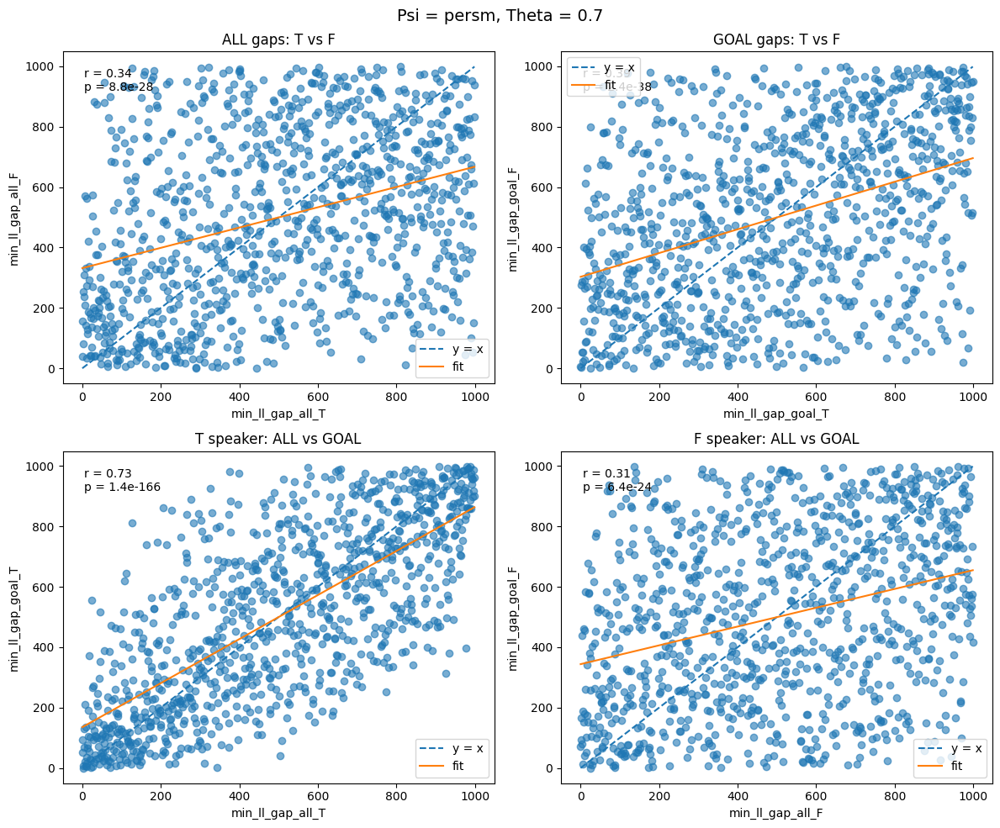

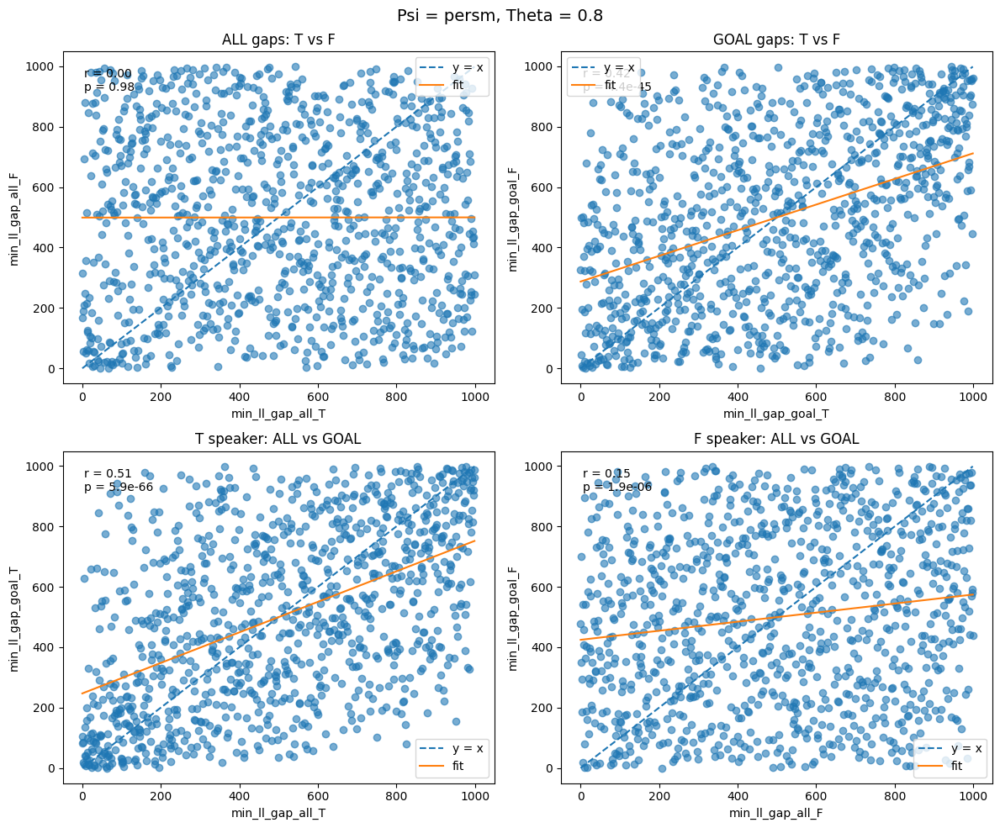

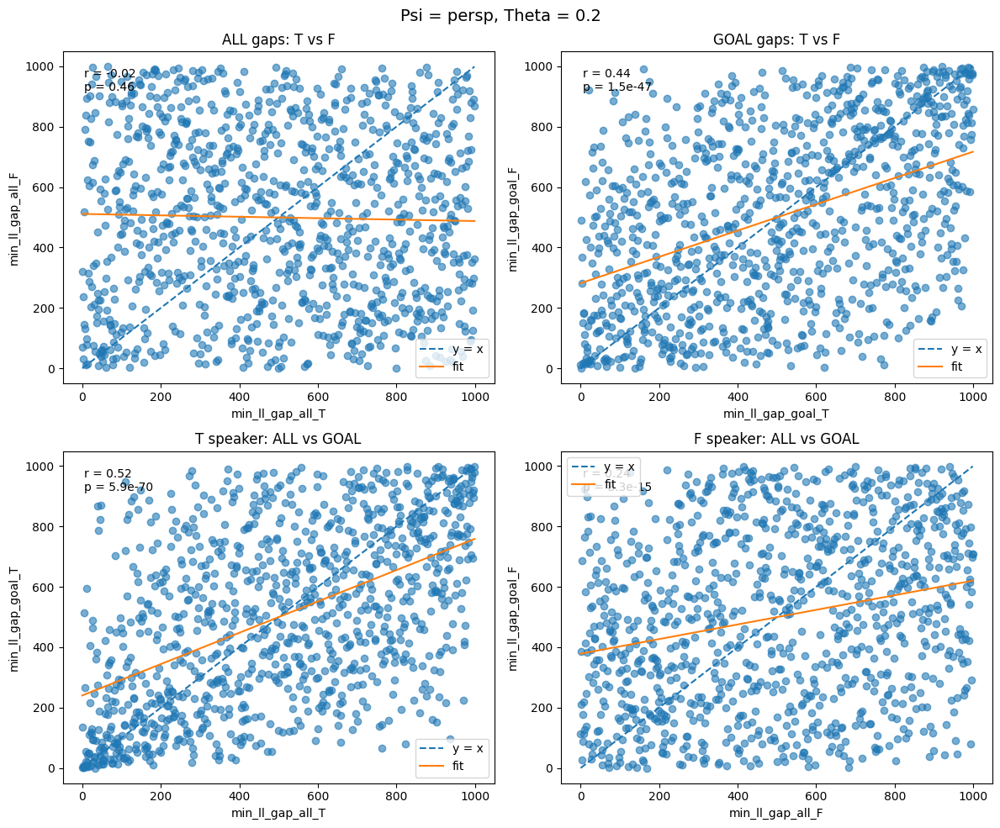

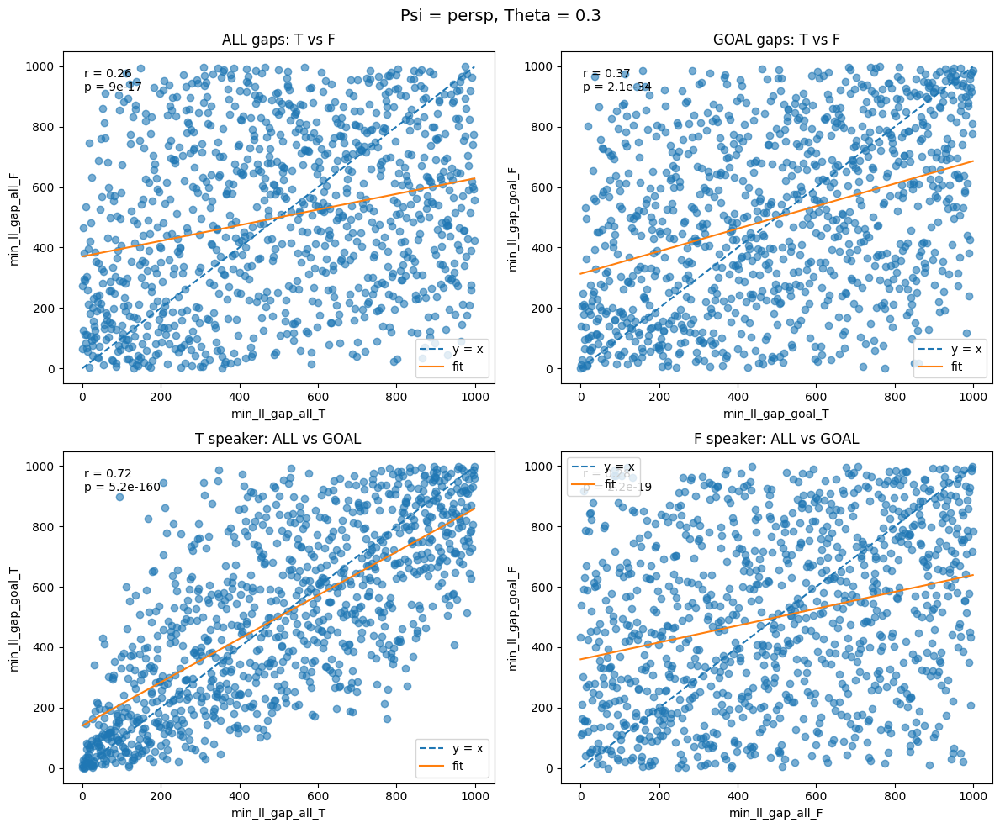

In [16]:
plot_value_comparisons_by_theta_psi(df_output, rank = True)

## Combined measures

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr, kendalltau
from scipy.stats import rankdata

def plot_ll_gap_scatter_by_theta_psi(
    df, measure1: str, measure2: str, rank: bool = False
):
    """
    Plot scatter plots for ll_gap measures grouped by theta and psi.

    Parameters:
    - df: pd.DataFrame with columns like 'min_ll_gap_all_min', 'min_ll_gap_goal_harmonic', etc.
    - measure1: str, one of ['min', 'mean', 'harmonic'] for the first measure
    - measure2: str, one of ['min', 'mean', 'harmonic'] for the second measure
    - rank: bool, if True, use ranks instead of real values and compute Kendall tau
    """

    grouped = df.groupby(["theta", "psi"])

    for (theta, psi), group in grouped:
        fig, axes = plt.subplots(2, 2, figsize=(14, 12))
        axes = axes.flatten()

        plots = [
            (f"min_ll_gap_all_{measure1}", f"min_ll_gap_all_{measure2}", f"All: {measure1} vs {measure2}"),
            (f"min_ll_gap_goal_{measure1}", f"min_ll_gap_goal_{measure2}", f"Goal: {measure1} vs {measure2}"),
            (f"min_ll_gap_all_{measure1}", f"min_ll_gap_goal_{measure1}", f"{measure1}: All vs Goal"),
            (f"min_ll_gap_all_{measure2}", f"min_ll_gap_goal_{measure2}", f"{measure2}: All vs Goal"),
        ]

        for ax, (xcol, ycol, title) in zip(axes, plots):
            # Drop NaNs
            data = group[[xcol, ycol]].dropna()
            if data.empty:
                ax.set_title(f"{title} (no data)")
                continue

            x = data[xcol].values
            y = data[ycol].values

            if rank:
                x = rankdata(x)
                y = rankdata(y)

            # Scatter
            ax.scatter(x, y, alpha=0.6)

            # Median lines
            ax.axvline(np.median(x), color='blue', linestyle='--', linewidth=1.5, label='Median x')
            ax.axhline(np.median(y), color='red', linestyle='--', linewidth=1.5, label='Median y')

            # y = x reference line
            min_val = min(x.min(), y.min())
            max_val = max(x.max(), y.max())
            ax.plot([min_val, max_val], [min_val, max_val], linestyle=":", color="gray", label="y=x")

            # Fit line + correlation
            if len(x) > 1:
                slope, intercept = np.polyfit(x, y, 1)
                xs = np.linspace(min_val, max_val, 100)
                ax.plot(xs, slope * xs + intercept, color="green", label="Linear fit")

                if rank:
                    tau, p_kendall = kendalltau(x, y)
                    ax.text(
                        0.05, 0.95,
                        f"Kendall tau = {tau:.2f}\np = {p_kendall:.2g}",
                        transform=ax.transAxes, va="top", fontsize=9, bbox=dict(facecolor='white', alpha=0.6)
                    )
                else:
                    r, p_pearson = pearsonr(x, y)
                    rho, p_spearman = spearmanr(x, y)
                    ax.text(
                        0.05, 0.95,
                        f"Pearson r = {r:.2f}\np = {p_pearson:.2g}\nSpearman rho = {rho:.2f}\np = {p_spearman:.2g}",
                        transform=ax.transAxes, va="top", fontsize=9, bbox=dict(facecolor='white', alpha=0.6)
                    )

            ax.set_title(title)
            ax.set_xlabel(xcol + (" (rank)" if rank else ""))
            ax.set_ylabel(ycol + (" (rank)" if rank else ""))
            ax.legend()

        fig.suptitle(f"Theta = {theta}, Psi = {psi} ({'Ranked' if rank else 'Raw values'})", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

### Harmonic and Min

#### Raw value

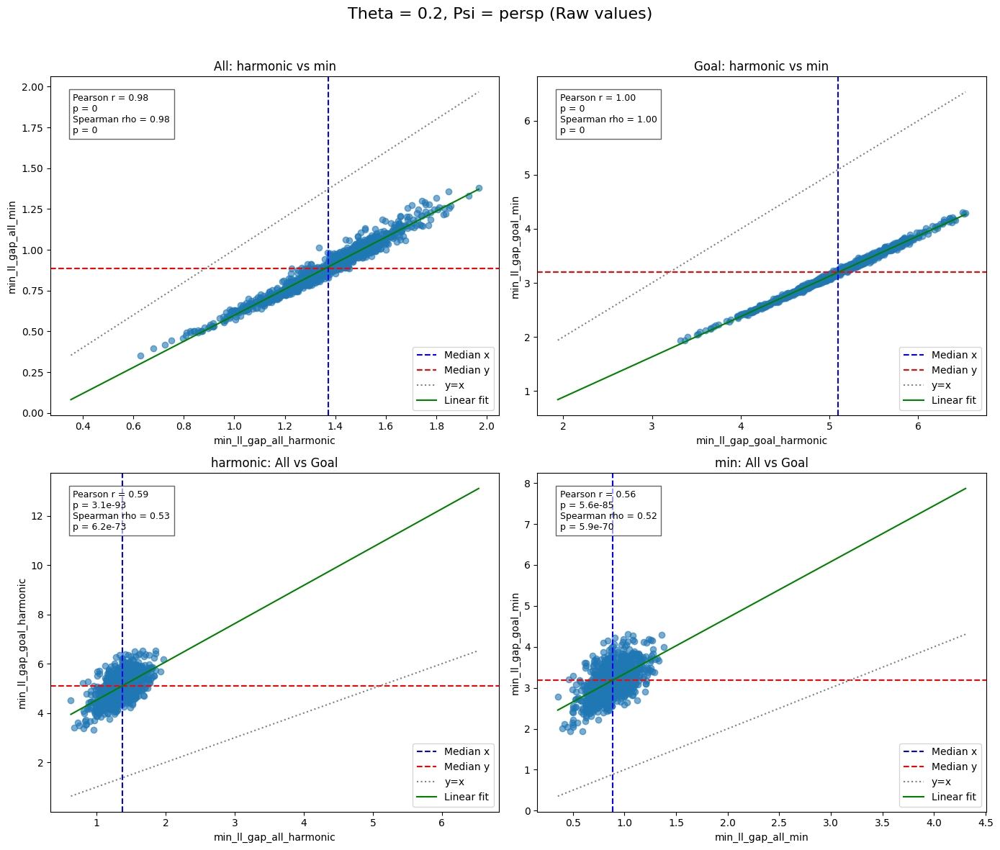

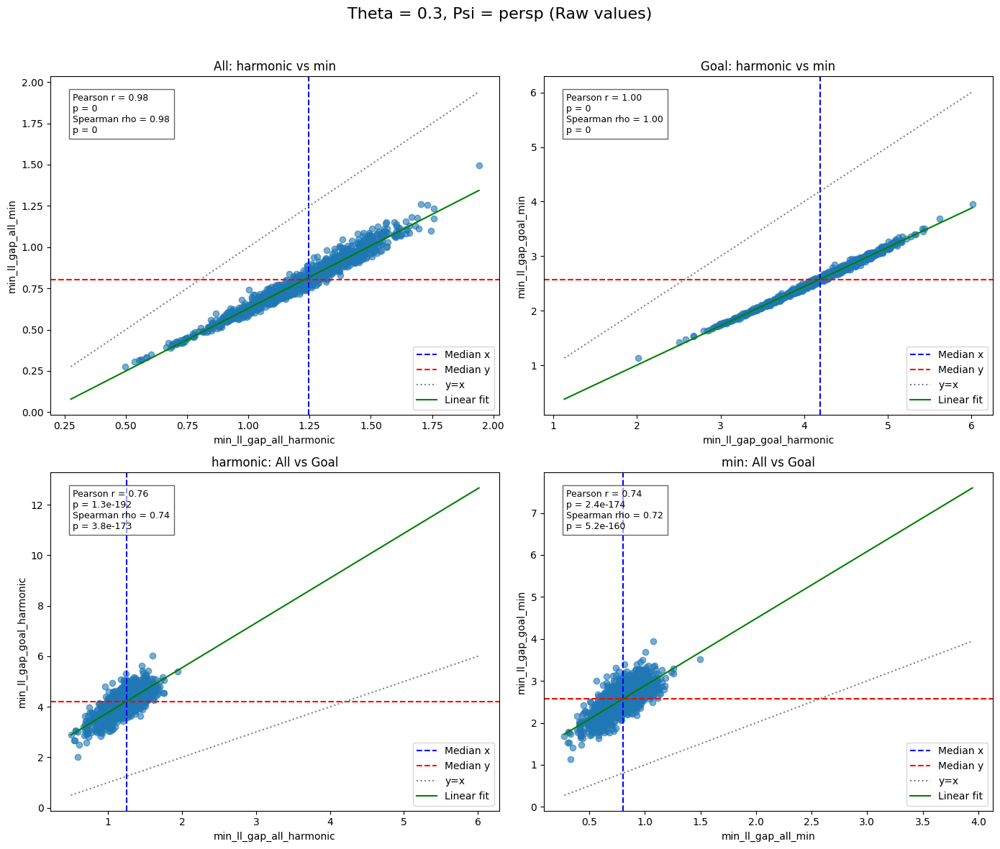

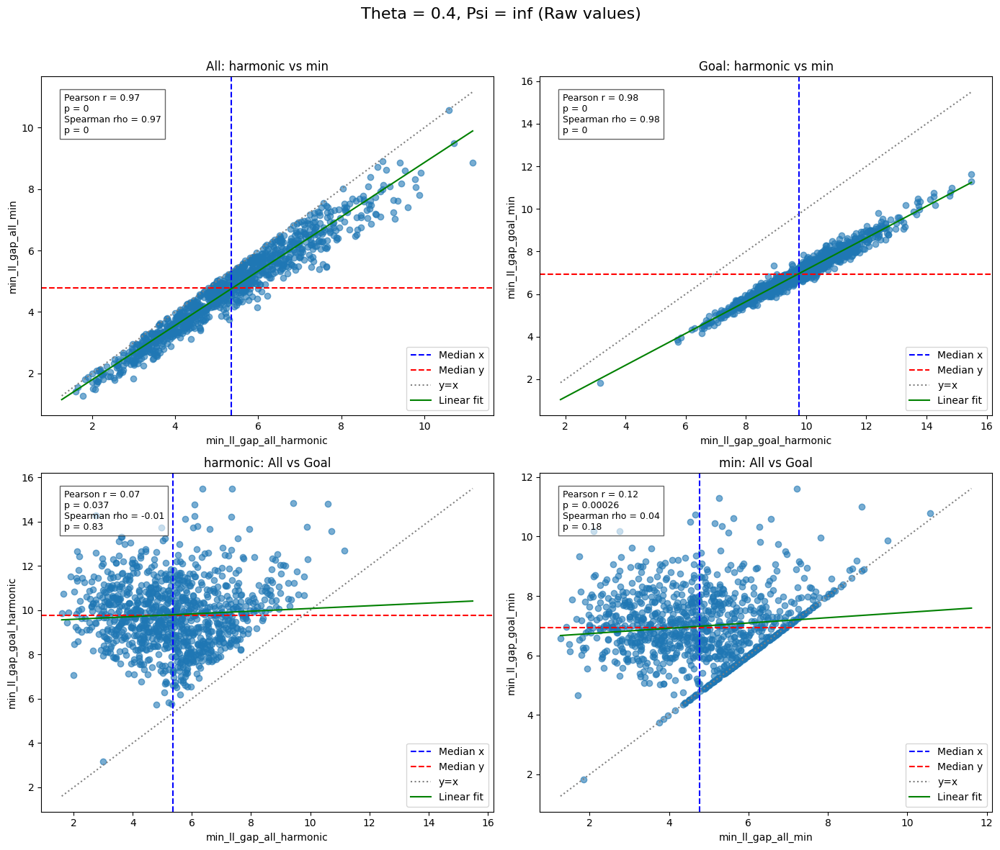

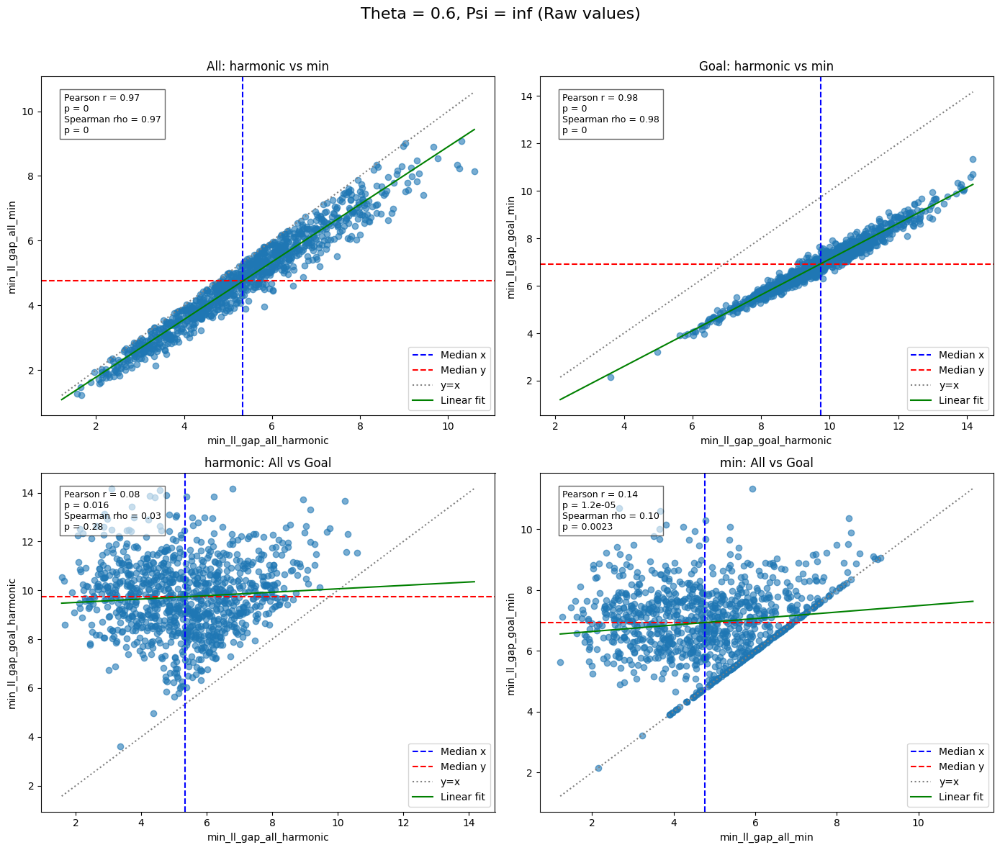

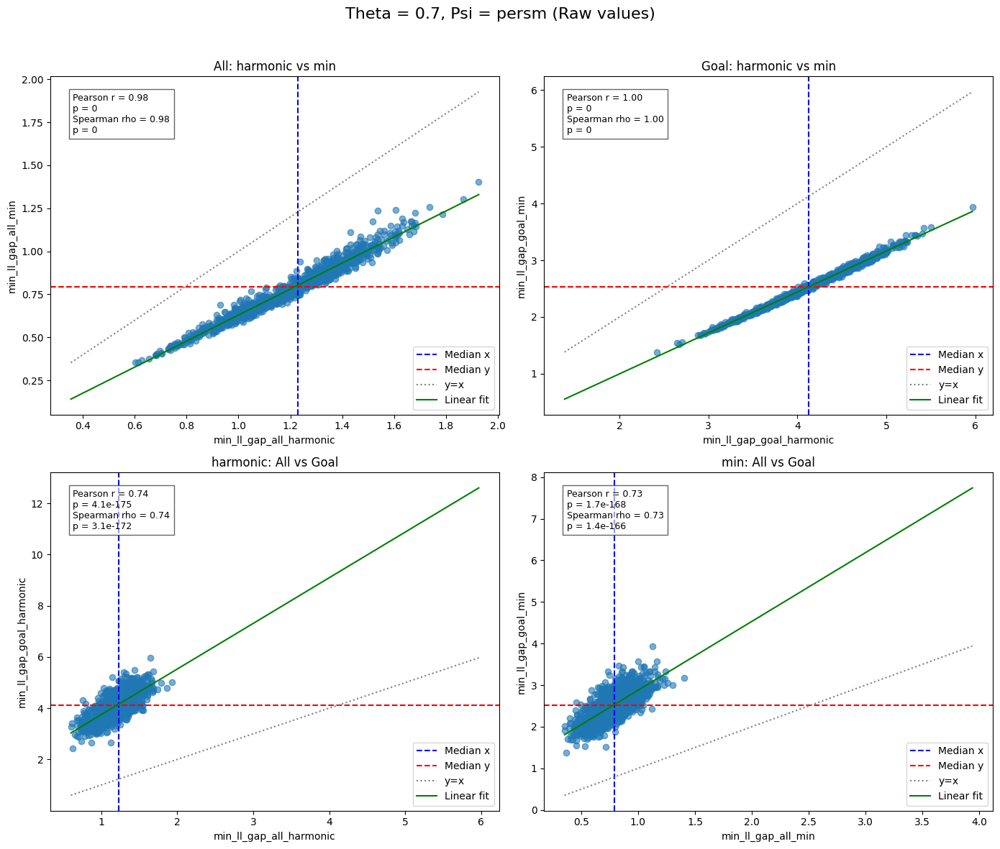

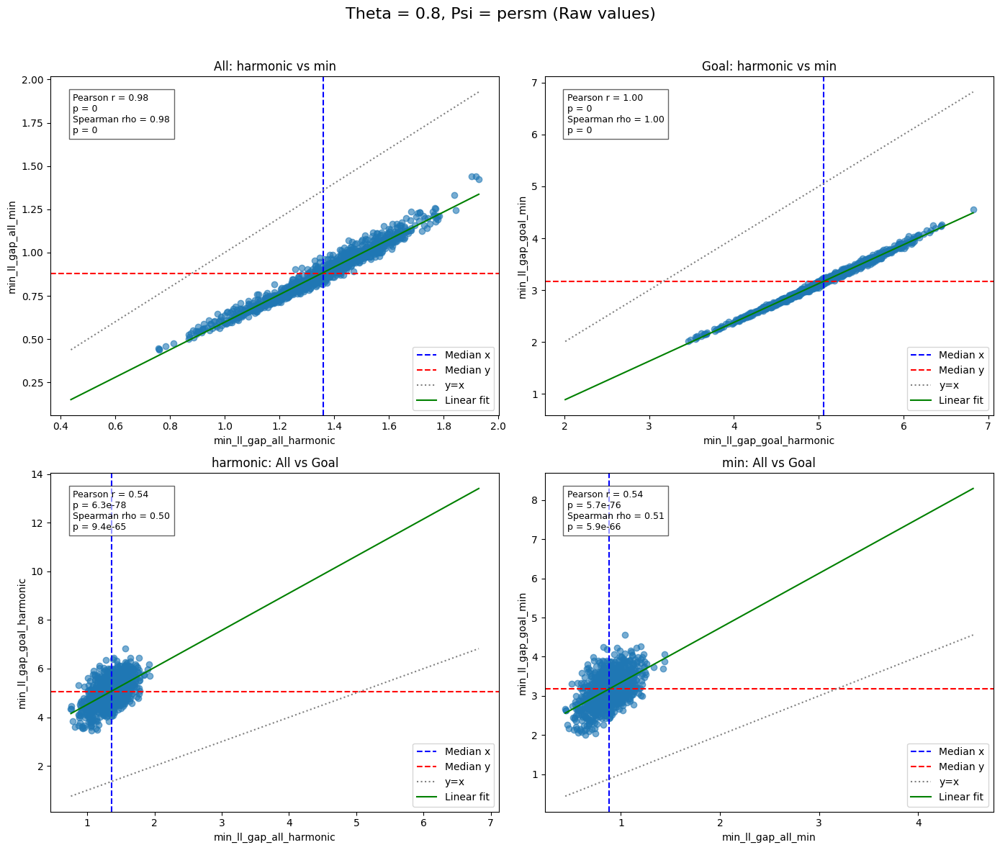

In [18]:
plot_ll_gap_scatter_by_theta_psi(df_output, measure1="harmonic", measure2="min", rank=False)

#### Rank

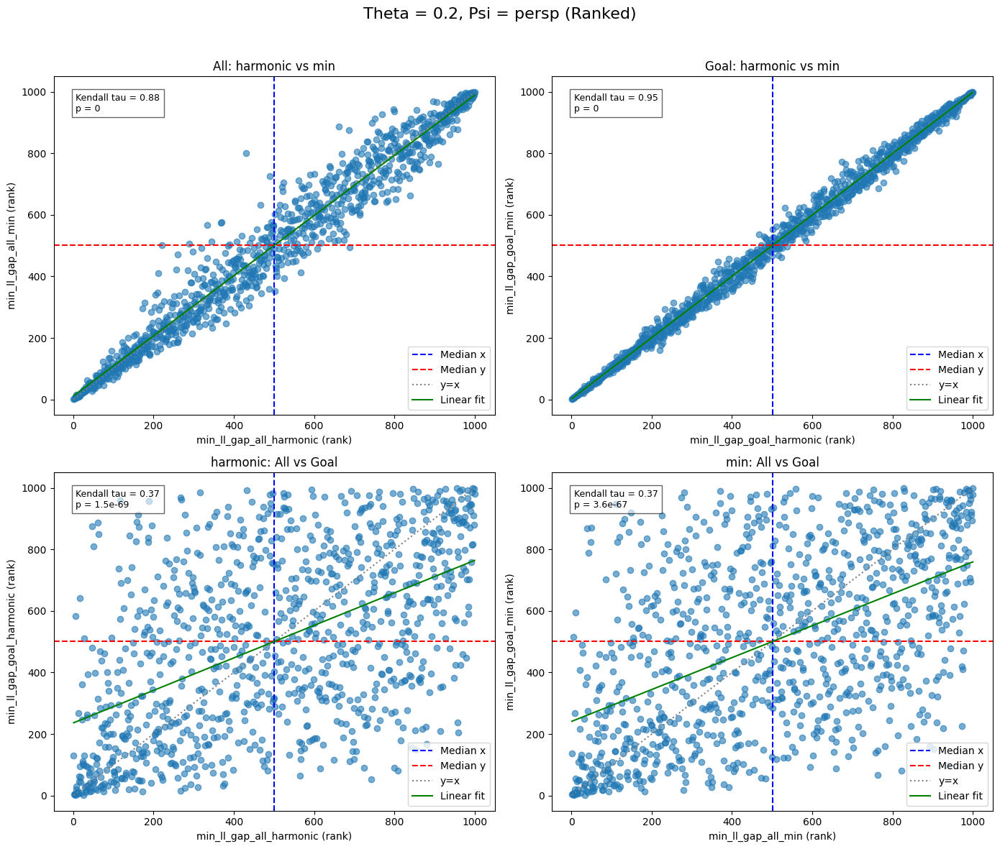

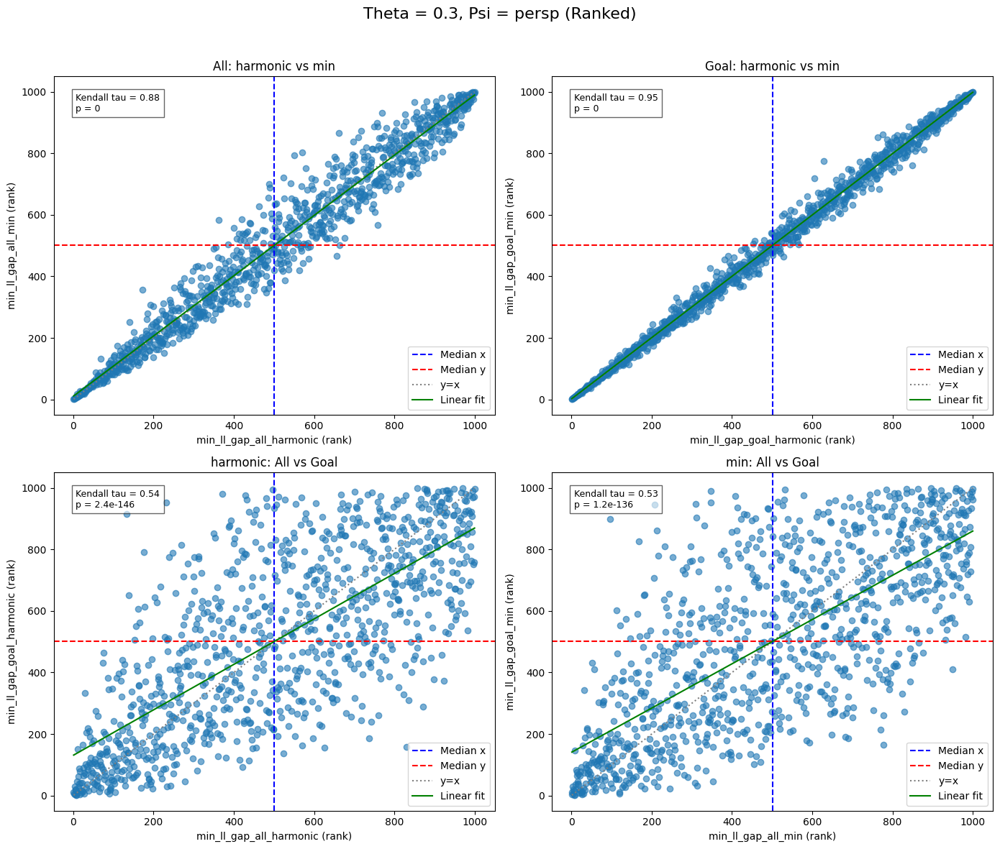

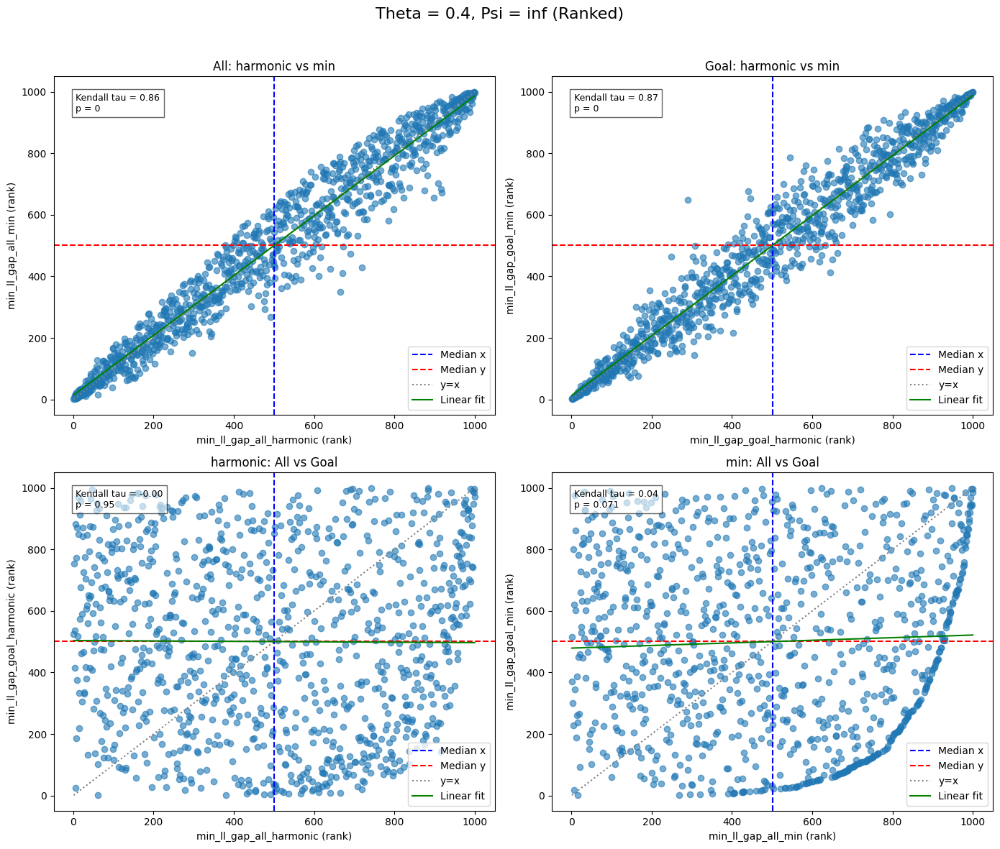

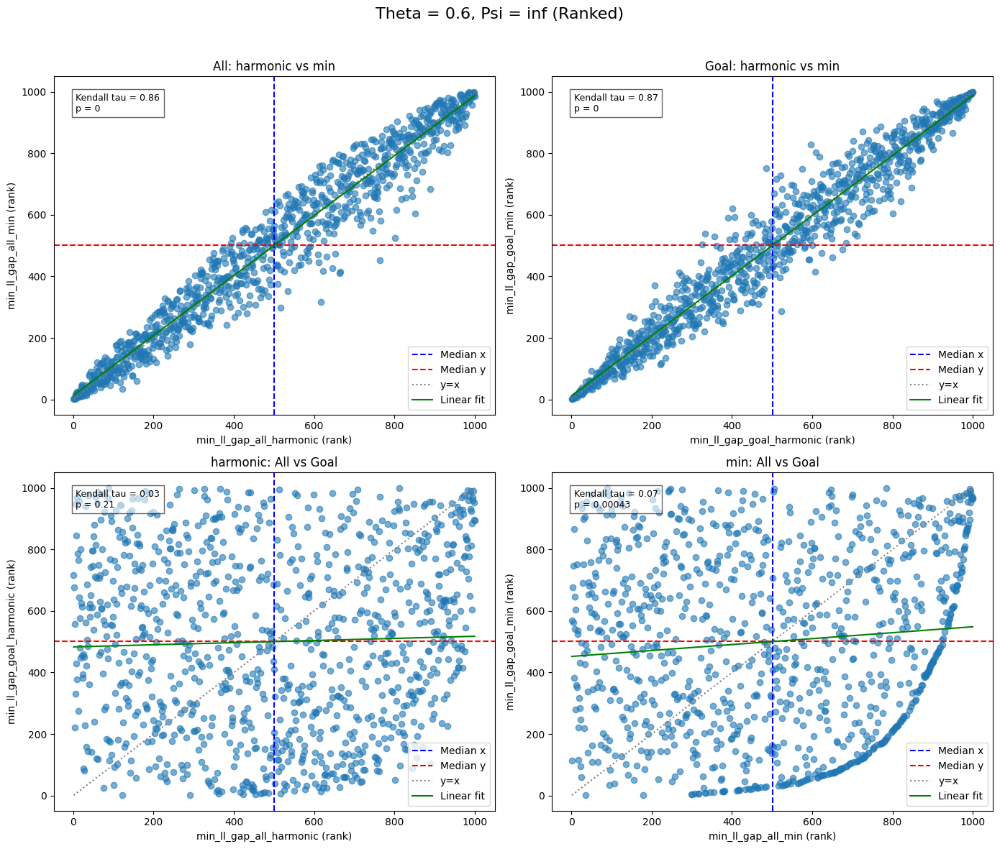

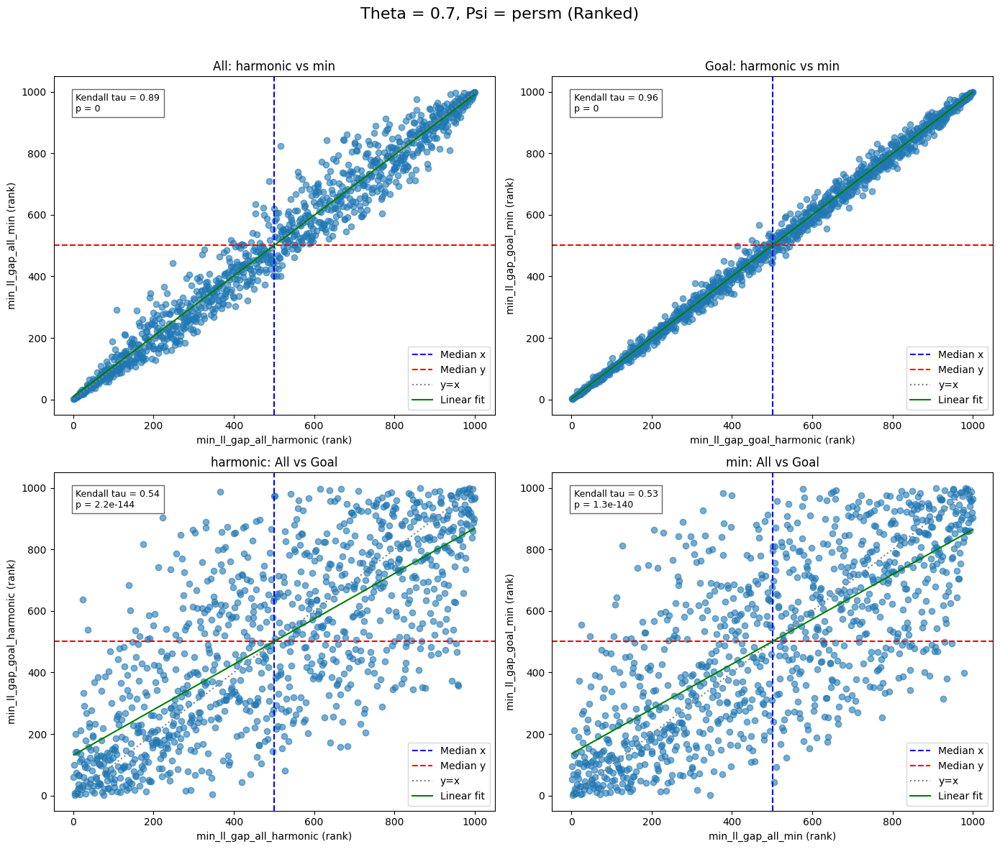

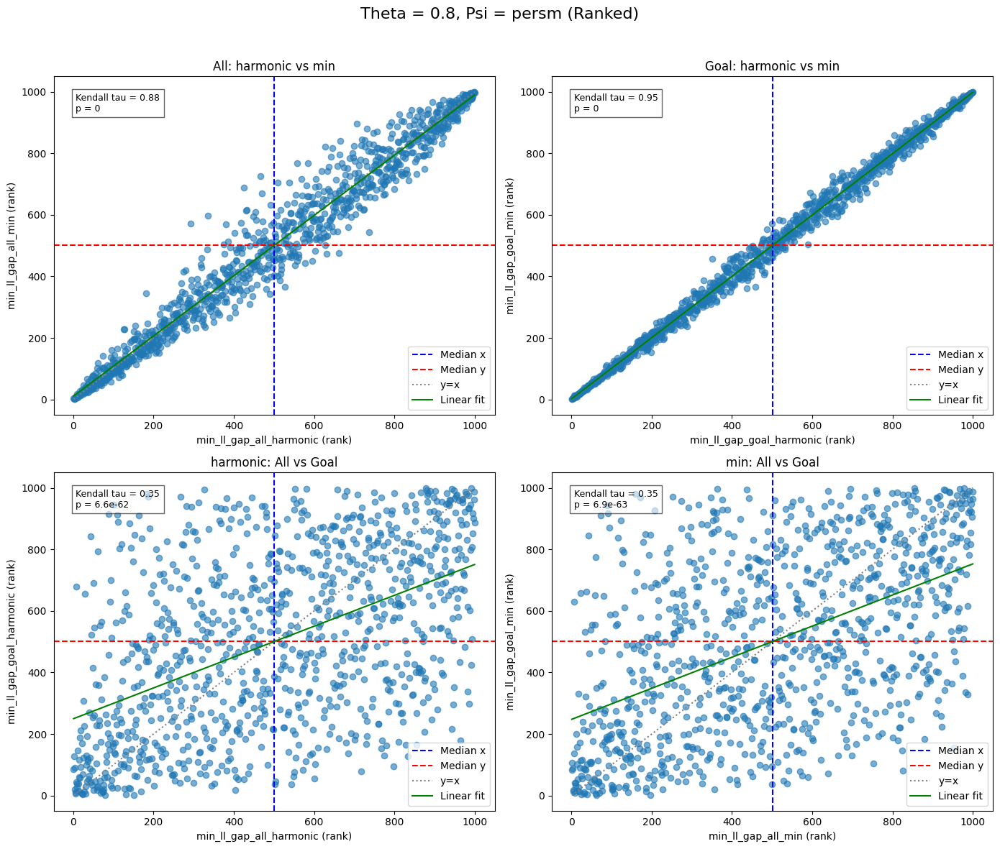

In [19]:
plot_ll_gap_scatter_by_theta_psi(df_output, measure1="harmonic", measure2="min", rank=True)

### Harmonic and Mean

#### Raw value

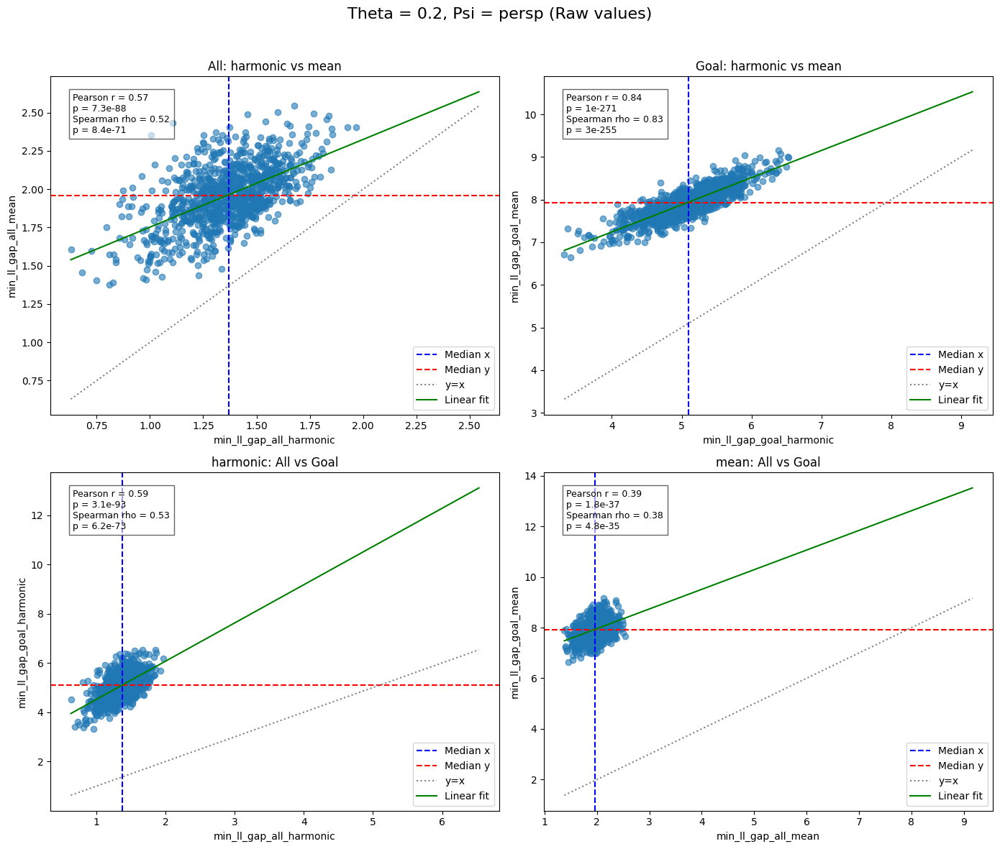

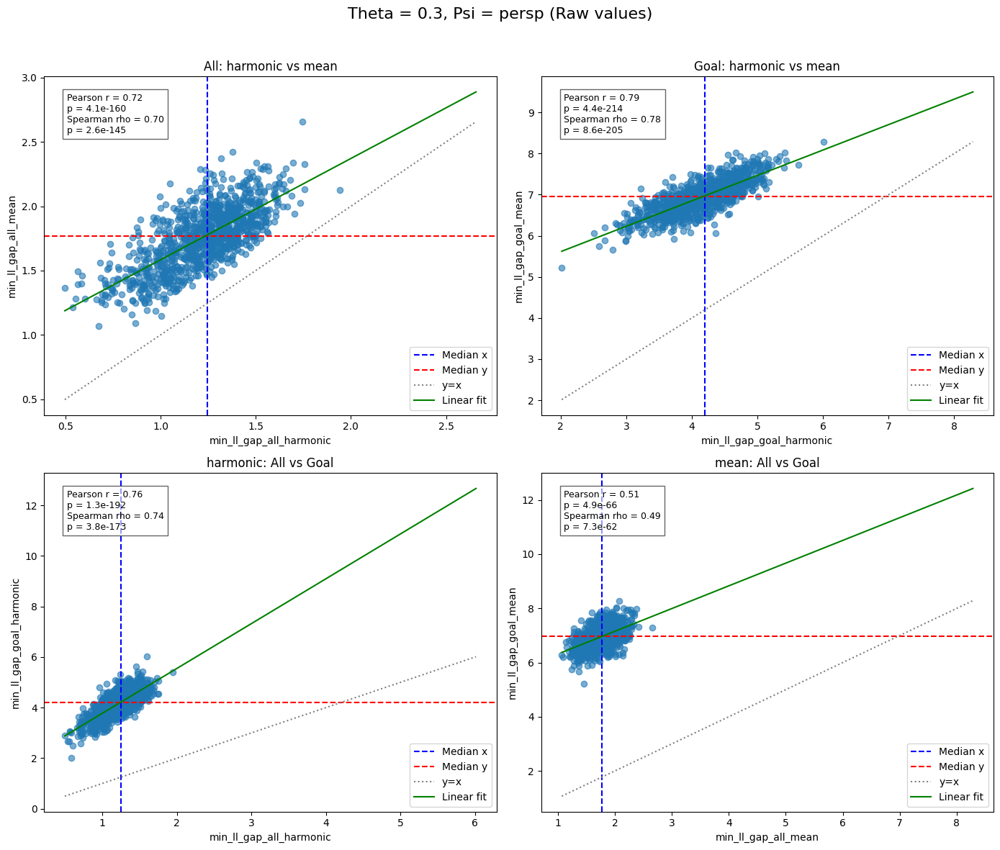

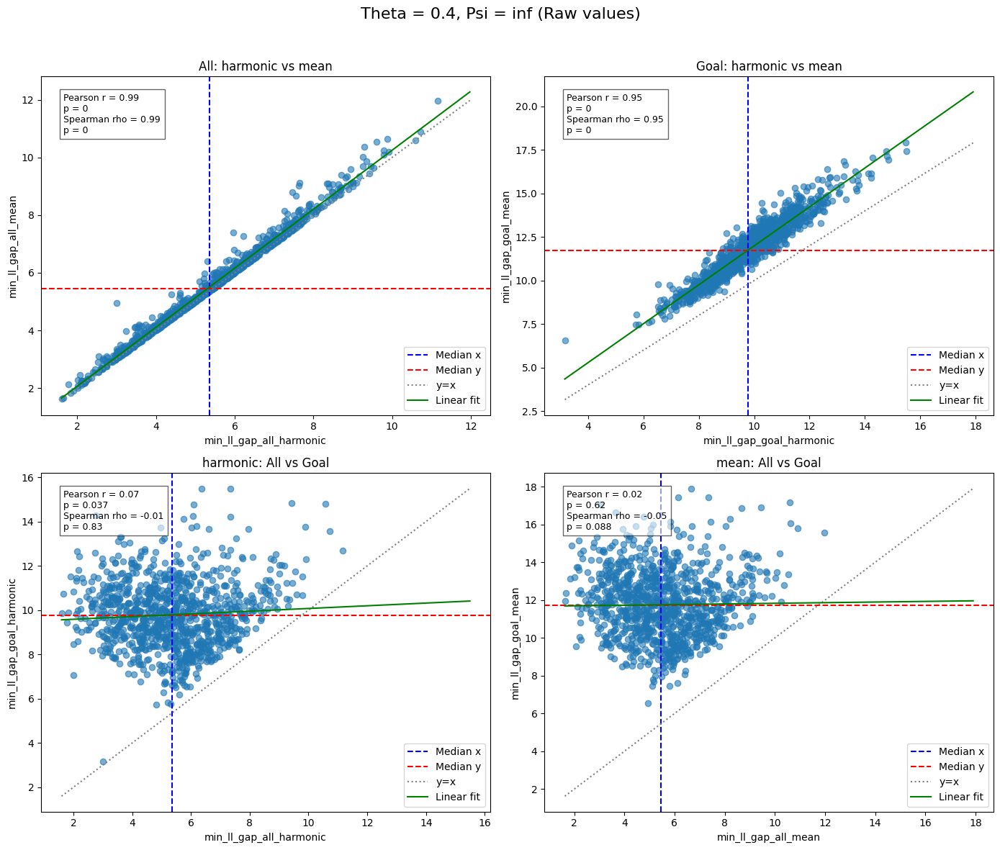

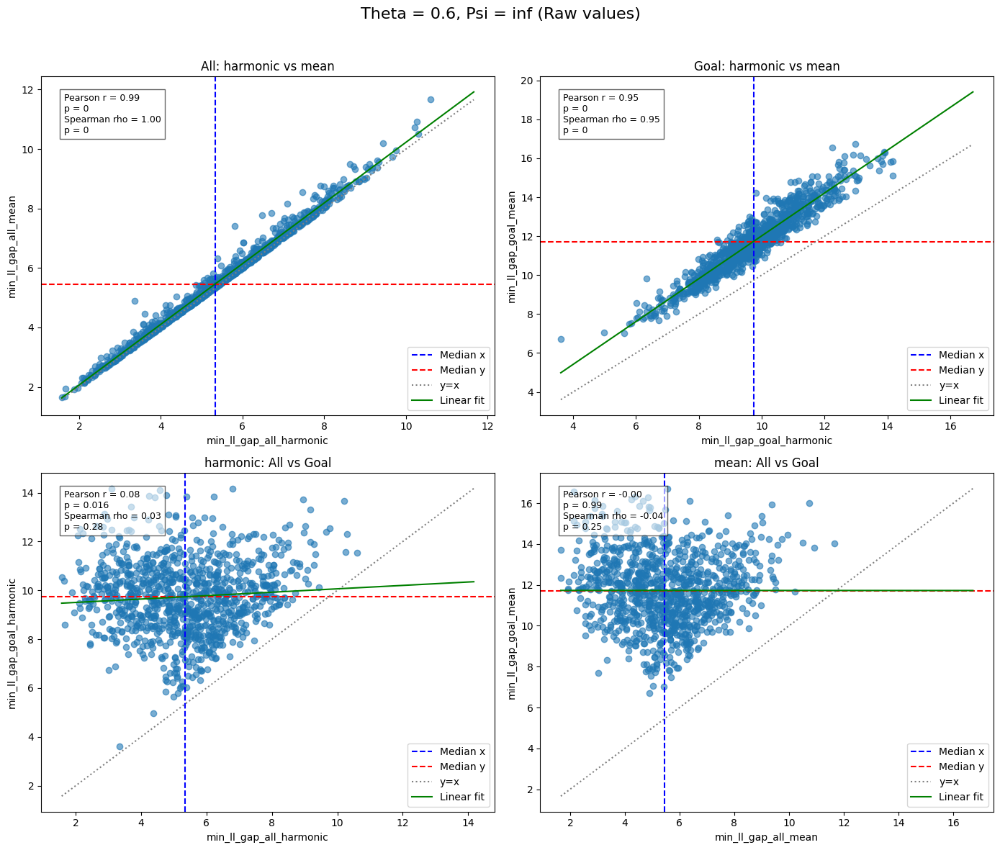

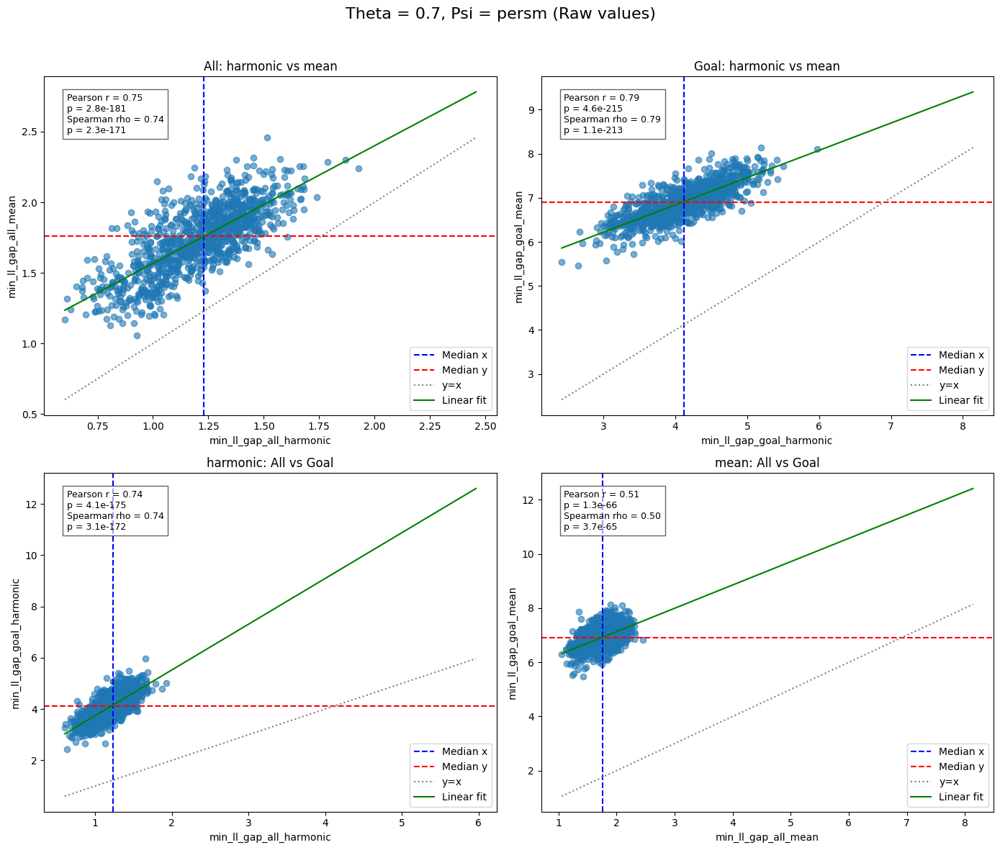

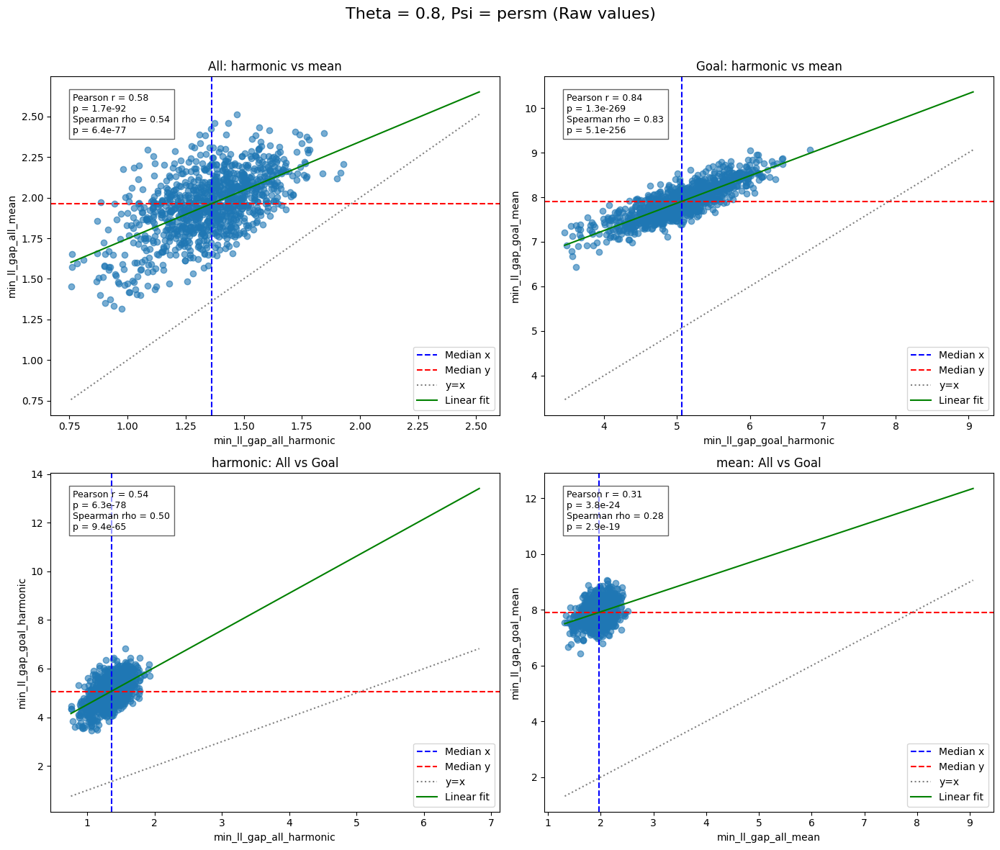

In [20]:
plot_ll_gap_scatter_by_theta_psi(df_output, measure1="harmonic", measure2="mean", rank=False)

#### Rank

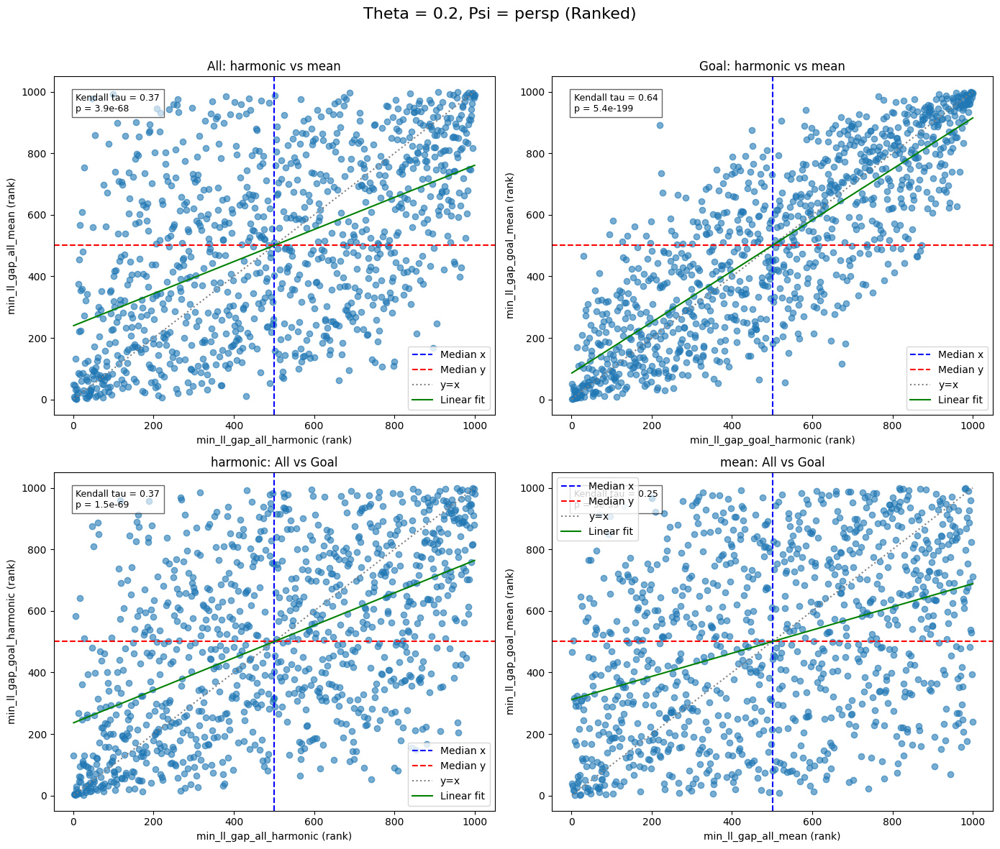

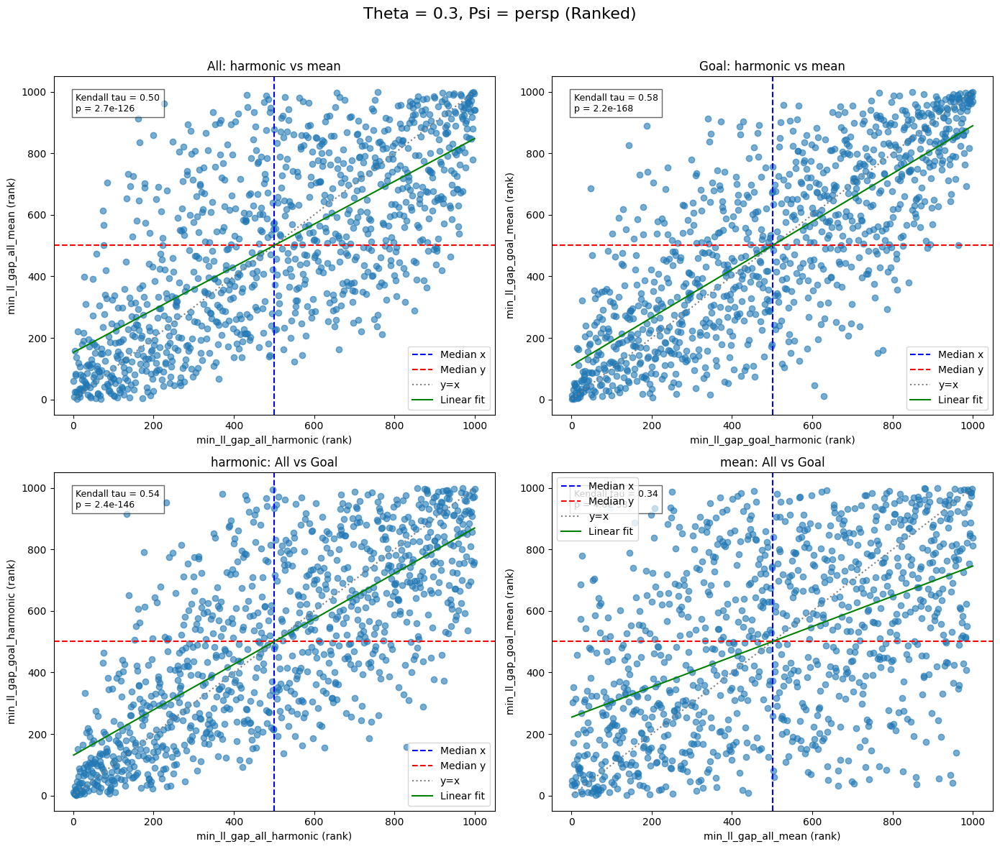

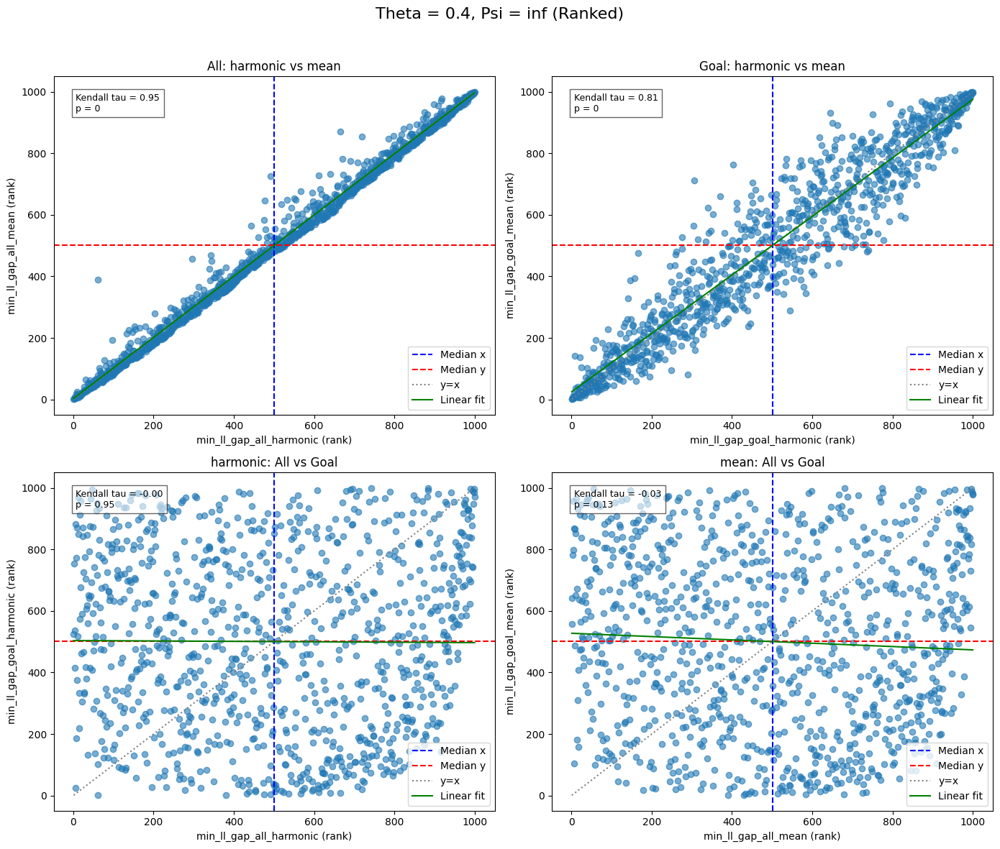

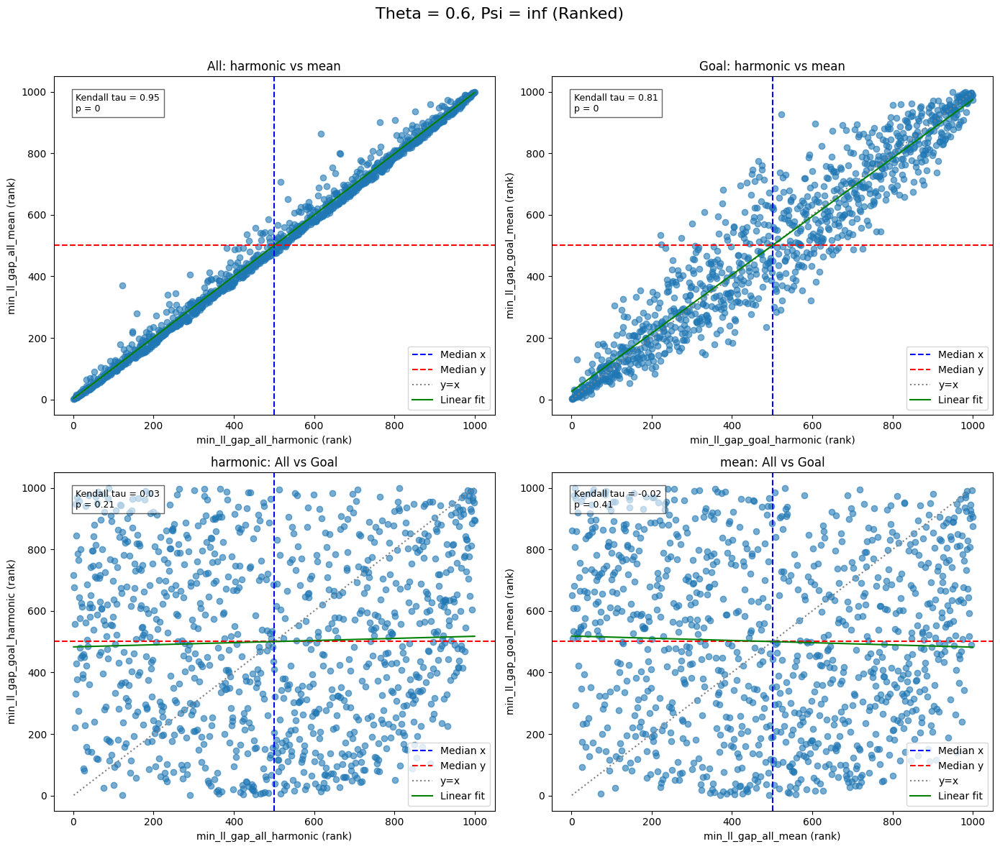

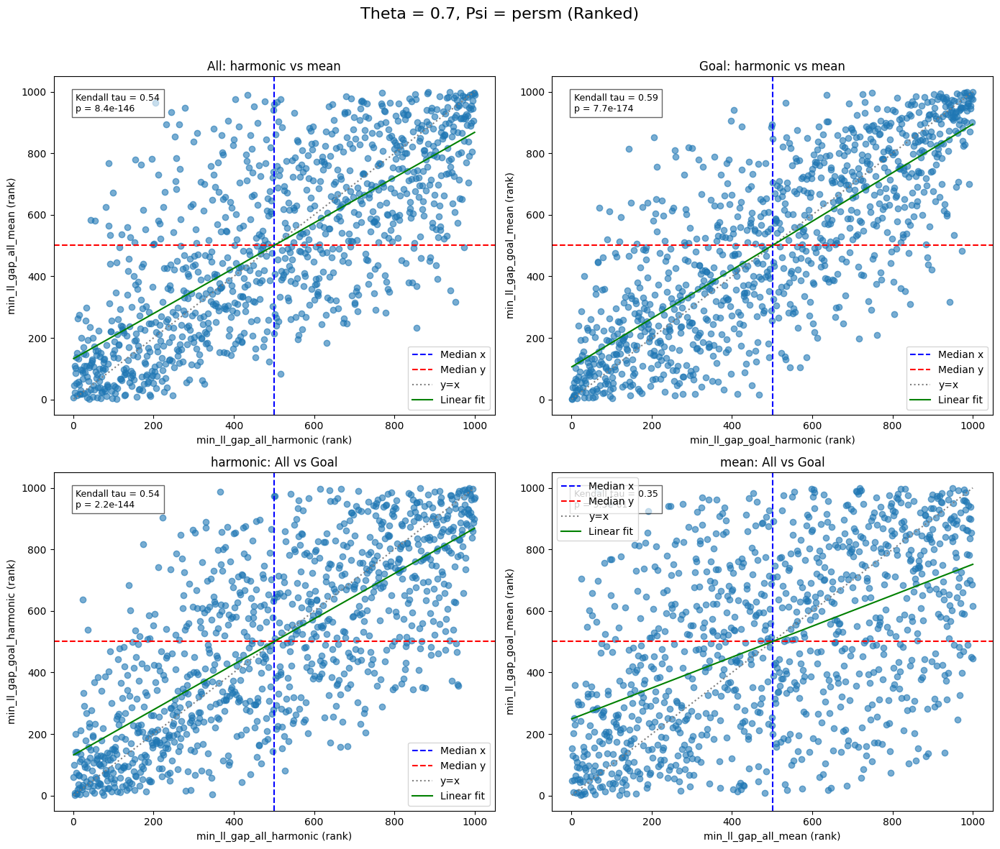

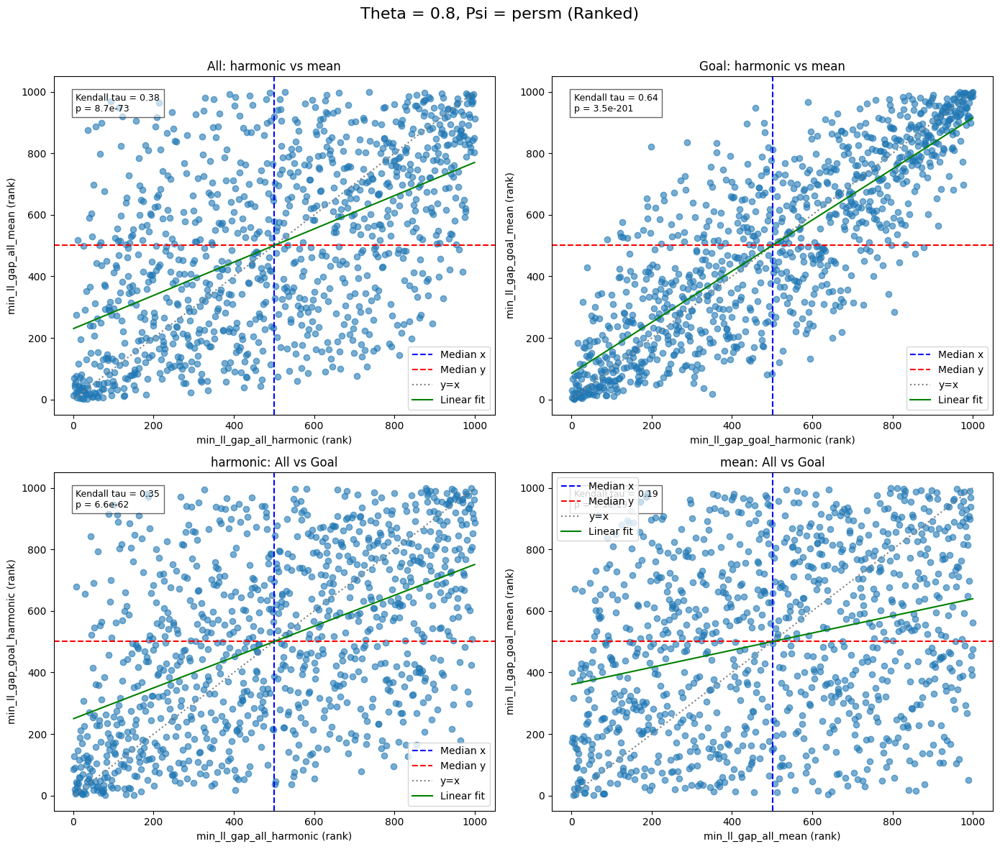

In [21]:
plot_ll_gap_scatter_by_theta_psi(df_output, measure1="harmonic", measure2="mean", rank=True)

# Deciding observation sequences

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import (
    pearsonr,
    spearmanr,
    mannwhitneyu,
    kruskal
)


def analyze_ll_gap_by_theta(
    df,
    psi,
    scope="goal",          # "all" or "goal"
    method="harmonic",     # "min", "mean", "harmonic"
    top_p_ll=1,            # top X% by LL gap
    top_n_obs=2,           # top N obs_log_lik per theta
    show_plots=True,
    run_tests=True
):
    """
    Full analysis pipeline:
      1. Global plots + tests (per psi)
      2. Per-theta plots + tests
      3. Collect top-N obs per theta from top-P% LL gap

    Returns:
      DataFrame with top-N obs per theta
    """

    assert scope in {"all", "goal"}
    assert method in {"min", "mean", "harmonic"}

    ll_col = f"min_ll_gap_{scope}_{method}"

    df_psi = df[df["psi"] == psi]

    if df_psi.empty:
        raise ValueError(f"No data for psi = {psi}")

    collected_rows = []

    # ============================================================
    # GLOBAL OVERVIEW (per psi)
    # ============================================================
    print(f"\n=== GLOBAL ANALYSIS: psi = {psi} ===")

    if show_plots:
        # --- Histogram by theta ---
        plt.figure(figsize=(10, 6))
        sns.histplot(
            data=df_psi,
            x="obs_log_lik",
            hue="theta",
            element="step",
            stat="density",
            common_norm=False,
            bins=50
        )
        plt.title(f'Distribution of obs_log_lik (psi = "{psi}")')
        plt.xlabel("obs_log_lik")
        plt.ylabel("Density")
        plt.show()

    # --- Kruskal–Wallis ---
    if run_tests:
        groups = [
            g["obs_log_lik"].values
            for _, g in df_psi.groupby("theta")
            if len(g) > 1
        ]
        if len(groups) >= 2:
            stat, p_kw = kruskal(*groups)
            print(f"Kruskal–Wallis H = {stat:.2f}, p = {p_kw:.3g}")
        else:
            print("Not enough theta groups for Kruskal–Wallis.")

    if show_plots:
        # --- Scatter with per-theta medians ---
        plt.figure(figsize=(8, 6))
        palette = sns.color_palette("tab10", n_colors=df_psi["theta"].nunique())

        sns.scatterplot(
            data=df_psi,
            x="obs_log_lik",
            y=ll_col,
            hue="theta",
            palette=palette,
            alpha=0.6
        )

        for i, (_, g) in enumerate(df_psi.groupby("theta")):
            plt.axvline(
                g["obs_log_lik"].median(),
                color=palette[i],
                linestyle="--",
                linewidth=1.5
            )
            plt.axhline(
                g[ll_col].median(),
                color=palette[i],
                linestyle=":",
                linewidth=1.5
            )

        plt.title(f'obs_log_lik vs {ll_col} (psi = "{psi}")')
        plt.xlabel("obs_log_lik")
        plt.ylabel(ll_col)
        plt.legend(title="theta")
        plt.show()

    # --- Correlations per theta ---
    if run_tests:
        for theta_val, g in df_psi.groupby("theta"):
            if len(g) < 2:
                continue

            r, p_r = pearsonr(g["obs_log_lik"], g[ll_col])
            rho, p_rho = spearmanr(g["obs_log_lik"], g[ll_col])

            print(f"Theta = {theta_val}")
            print(f"  Pearson r = {r:.2f}, p = {p_r:.3g}")
            print(f"  Spearman rho = {rho:.2f}, p = {p_rho:.3g}")

    # ============================================================
    # PER-THETA ANALYSIS
    # ============================================================
    for theta_val, df_theta in df_psi.groupby("theta"):
        print(f"\n=== Theta = {theta_val} ===")

        threshold = df_theta[ll_col].quantile(1 - top_p_ll / 100)
        top = df_theta[df_theta[ll_col] >= threshold]
        rest = df_theta[df_theta[ll_col] < threshold]

        print(f"Top {top_p_ll}% threshold ({ll_col}) = {threshold:.3f}")
        print(f"Top: {len(top)}, Rest: {len(rest)}")

        if top.empty:
            continue

        if show_plots:
            # --- Histogram ---
            plt.figure(figsize=(8, 5))
            sns.histplot(rest["obs_log_lik"], bins=30, stat="density",
                         alpha=0.5, label="Rest")
            sns.histplot(top["obs_log_lik"], bins=30, stat="density",
                         alpha=0.5, label=f"Top {top_p_ll}%")

            plt.axvline(rest["obs_log_lik"].median(), linestyle="--")
            plt.axvline(top["obs_log_lik"].median(), linestyle="--")

            plt.title(
                f"Theta = {theta_val}: obs_log_lik\n"
                f"Top {top_p_ll}% of {ll_col}"
            )
            plt.xlabel("obs_log_lik")
            plt.ylabel("Density")
            plt.legend()
            plt.show()

            # --- Scatter ---
            plt.figure(figsize=(8, 6))
            plt.scatter(rest["obs_log_lik"], rest[ll_col],
                        alpha=0.3, label="Rest")
            plt.scatter(top["obs_log_lik"], top[ll_col],
                        alpha=0.7, label=f"Top {top_p_ll}%")

            plt.axvline(rest["obs_log_lik"].median(), linestyle="--")
            plt.axvline(top["obs_log_lik"].median(), linestyle="--")
            plt.axhline(rest[ll_col].median(), linestyle=":")
            plt.axhline(top[ll_col].median(), linestyle=":")

            plt.title(
                f"Theta = {theta_val}: obs_log_lik vs {ll_col}"
            )
            plt.xlabel("obs_log_lik")
            plt.ylabel(ll_col)
            plt.legend()
            plt.show()

        # --- Mann–Whitney ---
        if run_tests and len(top) > 0 and len(rest) > 0:
            u, p_u = mannwhitneyu(
                top["obs_log_lik"],
                rest["obs_log_lik"],
                alternative="two-sided"
            )
            print(f"Mann–Whitney U = {u:.1f}, p = {p_u:.3g}")

        # --- Collect top-N obs ---
        top_obs = (
            top.sort_values("obs_log_lik", ascending=False)
            .head(top_n_obs)
            .copy()
        )

        top_obs["psi"] = psi
        top_obs["theta"] = theta_val
        top_obs["scope"] = scope
        top_obs["method"] = method
        top_obs["top_p_ll"] = top_p_ll
        top_obs["top_n_obs"] = top_n_obs

        collected_rows.append(top_obs)

    return pd.concat(collected_rows, ignore_index=True)

## Informative


=== GLOBAL ANALYSIS: psi = inf ===


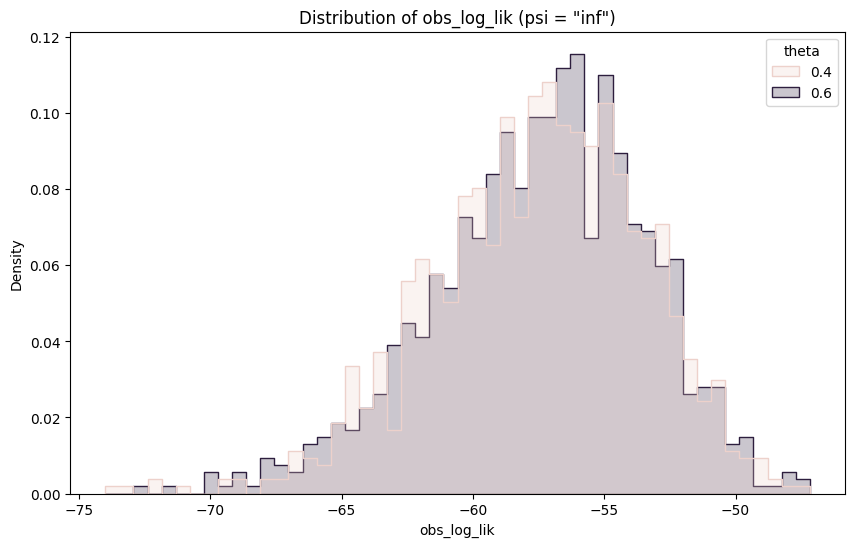

Kruskal–Wallis H = 0.23, p = 0.63


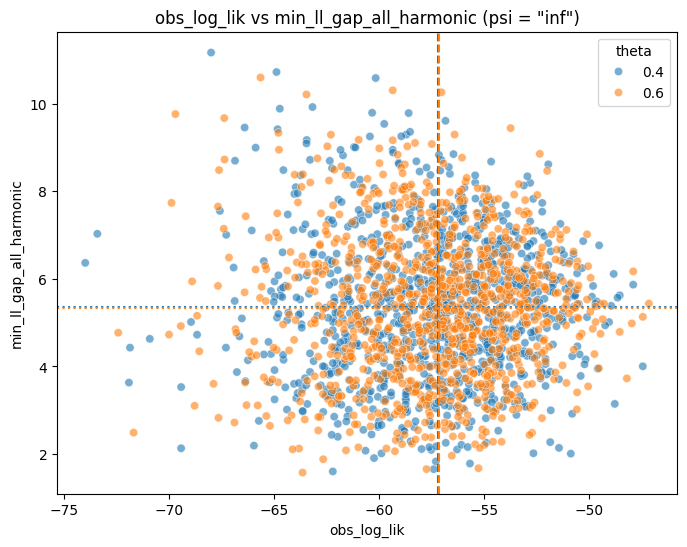

Theta = 0.4
  Pearson r = -0.01, p = 0.655
  Spearman rho = 0.03, p = 0.316
Theta = 0.6
  Pearson r = -0.02, p = 0.494
  Spearman rho = 0.00, p = 0.992

=== Theta = 0.4 ===
Top 4% threshold (min_ll_gap_all_harmonic) = 8.472
Top: 40, Rest: 960


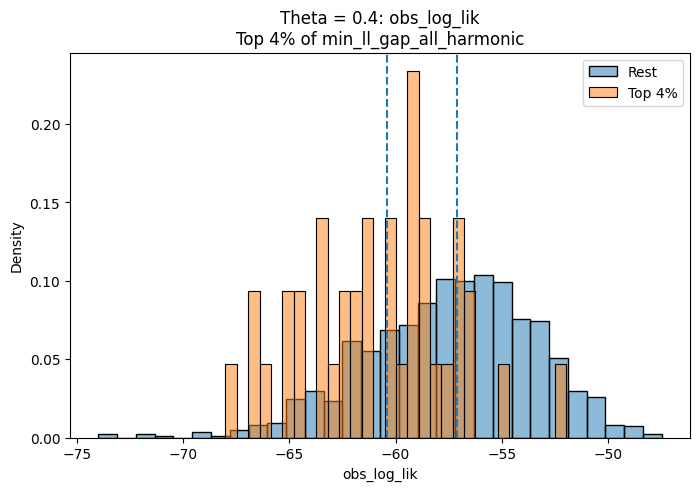

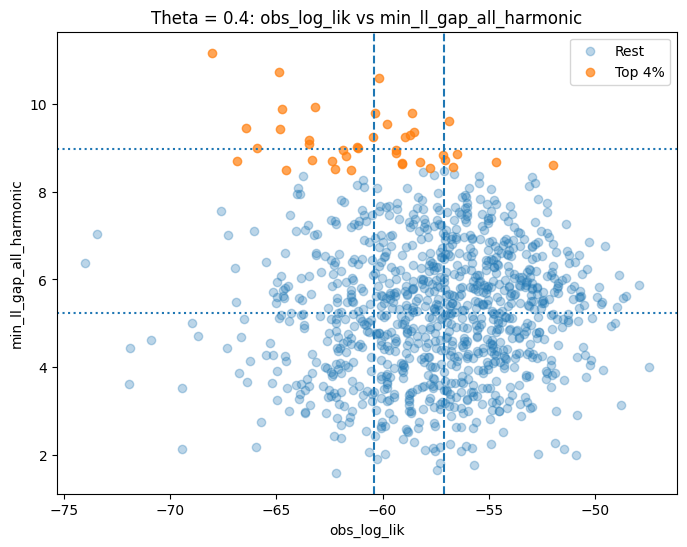

Mann–Whitney U = 9879.5, p = 1.91e-07

=== Theta = 0.6 ===
Top 4% threshold (min_ll_gap_all_harmonic) = 8.218
Top: 40, Rest: 960


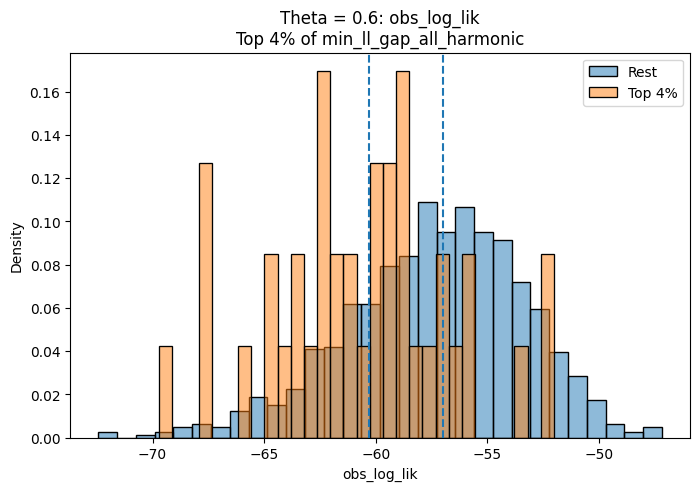

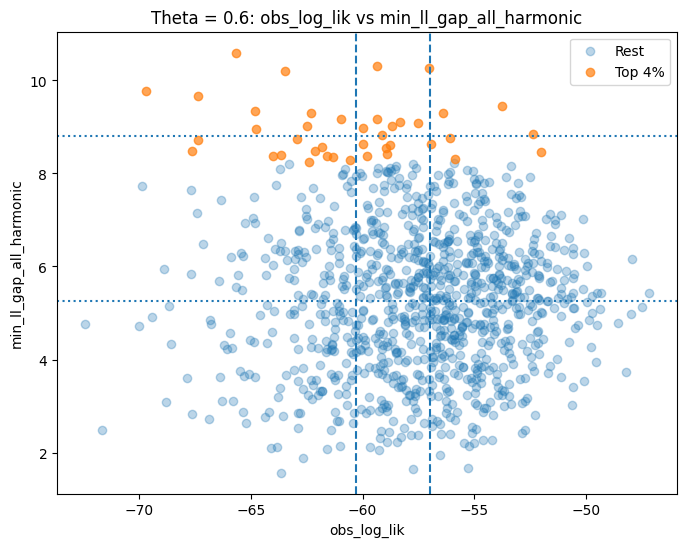

Mann–Whitney U = 10466.0, p = 1.06e-06


,psi,theta,obs_id,obs_seq,obs_log_lik,min_ll_gap_all_T,min_ll_gap_all_F,min_ll_gap_goal_T,min_ll_gap_goal_F,min_ll_gap_all_min,min_ll_gap_all_mean,min_ll_gap_all_harmonic,min_ll_gap_goal_min,min_ll_gap_goal_mean,min_ll_gap_goal_harmonic,scope,method,top_p_ll,top_n_obs
0,inf,0.4,238,"[(3, 2, 0, 0, 0), (1, 2, 1, 1, 0), (1, 2, 2, 0...",-51.960406,10.471668,7.313899,16.037824,7.313899,7.313899,8.892783,8.612458,7.313899,11.675861,10.046284,all,harmonic,4,2
1,inf,0.4,726,"[(2, 1, 2, 0, 0), (1, 2, 1, 1, 0), (1, 2, 2, 0...",-54.680878,10.298980,7.493017,19.665630,7.978900,7.493017,8.895999,8.674735,7.978900,13.822265,11.351981,all,harmonic,4,2
2,inf,0.6,943,"[(0, 0, 3, 1, 1), (0, 0, 0, 4, 1), (0, 0, 3, 1...",-52.012522,11.126156,6.830176,15.170584,6.830176,6.830176,8.978166,8.464268,6.830176,11.000380,9.419471,all,harmonic,4,2
3,inf,0.6,143,"[(0, 0, 2, 3, 0), (0, 1, 2, 1, 1), (0, 0, 4, 1...",-52.365871,9.653884,8.174185,16.776830,8.174185,8.174185,8.914035,8.852628,8.174185,12.475508,10.992491,all,harmonic,4,2


In [23]:
df_top_inf = analyze_ll_gap_by_theta(
    df_output,
    psi="inf",
    scope="all",
    method="harmonic",
    top_p_ll=4,
    top_n_obs=2,
    show_plots=True,
    run_tests=True
)

df_top_inf

In [26]:
for _, row in df_top_inf.iterrows():
    print(row["obs_seq"], "\n")

[(3, 2, 0, 0, 0), (1, 2, 1, 1, 0), (1, 2, 2, 0, 0), (1, 2, 2, 0, 0), (1, 3, 1, 0, 0), (0, 3, 2, 0, 0), (0, 2, 3, 0, 0), (0, 2, 2, 1, 0), (1, 2, 1, 1, 0), (0, 0, 3, 2, 0), (0, 2, 3, 0, 0), (1, 1, 3, 0, 0), (1, 3, 1, 0, 0), (0, 3, 0, 2, 0), (1, 1, 3, 0, 0)] 

[(2, 1, 2, 0, 0), (1, 2, 1, 1, 0), (1, 2, 2, 0, 0), (1, 2, 1, 1, 0), (0, 0, 3, 2, 0), (1, 2, 1, 1, 0), (0, 2, 1, 2, 0), (1, 1, 1, 2, 0), (0, 3, 2, 0, 0), (2, 3, 0, 0, 0), (0, 1, 2, 2, 0), (2, 3, 0, 0, 0), (0, 1, 4, 0, 0), (0, 2, 3, 0, 0), (0, 4, 1, 0, 0)] 

[(0, 0, 3, 1, 1), (0, 0, 0, 4, 1), (0, 0, 3, 1, 1), (0, 0, 2, 2, 1), (0, 0, 3, 2, 0), (0, 2, 1, 1, 1), (0, 1, 1, 3, 0), (0, 0, 1, 2, 2), (0, 1, 1, 2, 1), (0, 0, 2, 1, 2), (0, 0, 3, 2, 0), (0, 0, 1, 4, 0), (0, 2, 3, 0, 0), (0, 0, 2, 2, 1), (0, 0, 2, 2, 1)] 

[(0, 0, 2, 3, 0), (0, 1, 2, 1, 1), (0, 0, 4, 1, 0), (0, 1, 0, 3, 1), (0, 0, 3, 2, 0), (0, 0, 2, 2, 1), (0, 0, 1, 1, 3), (0, 0, 3, 2, 0), (0, 1, 3, 1, 0), (0, 0, 2, 3, 0), (0, 0, 2, 3, 0), (0, 0, 2, 2, 1), (1, 0, 1, 3, 0), (0, 

## Persm

In [28]:
df_top_persm_all = analyze_ll_gap_by_theta(
    df_output,
    psi="persm",
    scope="all",
    method="harmonic",
    top_p_ll=4,
    top_n_obs=13,
    show_plots=False,
    run_tests=False
)


df_top_persm_goal = analyze_ll_gap_by_theta(
    df_output,
    psi="persm",
    scope="goal",
    method="harmonic",
    top_p_ll=4,
    top_n_obs=13,
    show_plots=False,
    run_tests=False
)

strict_overlap_persm = (
    df_top_persm_all.merge(
        df_top_persm_goal,
        on=["obs_id", "theta"],
        suffixes=("_all", "_goal"),
        how="inner"
    )
)

print(f"Strict overlap (same theta): {len(strict_overlap_persm)}")
strict_overlap_persm


=== GLOBAL ANALYSIS: psi = persm ===

=== Theta = 0.7 ===
Top 4% threshold (min_ll_gap_all_harmonic) = 1.551
Top: 40, Rest: 960

=== Theta = 0.8 ===
Top 4% threshold (min_ll_gap_all_harmonic) = 1.658
Top: 40, Rest: 960

=== GLOBAL ANALYSIS: psi = persm ===

=== Theta = 0.7 ===
Top 4% threshold (min_ll_gap_goal_harmonic) = 4.982
Top: 40, Rest: 960

=== Theta = 0.8 ===
Top 4% threshold (min_ll_gap_goal_harmonic) = 5.971
Top: 40, Rest: 960
Strict overlap (same theta): 5


,psi_all,theta,obs_id,obs_seq_all,obs_log_lik_all,min_ll_gap_all_T_all,min_ll_gap_all_F_all,min_ll_gap_goal_T_all,min_ll_gap_goal_F_all,min_ll_gap_all_min_all,...,min_ll_gap_all_min_goal,min_ll_gap_all_mean_goal,min_ll_gap_all_harmonic_goal,min_ll_gap_goal_min_goal,min_ll_gap_goal_mean_goal,min_ll_gap_goal_harmonic_goal,scope_goal,method_goal,top_p_ll_goal,top_n_obs_goal
0,persm,0.7,871,"[(0, 0, 1, 3, 1), (0, 0, 1, 1, 3), (0, 0, 0, 3...",-48.242996,1.172642,2.882314,3.187545,11.533196,1.172642,...,1.172642,2.027478,1.667057,3.187545,7.360370,4.994664,goal,harmonic,4,13
1,persm,0.7,383,"[(0, 0, 0, 4, 1), (0, 0, 1, 2, 2), (0, 0, 0, 4...",-48.981191,1.100645,2.683376,3.326155,12.217505,1.100645,...,1.100645,1.892011,1.561009,3.326155,7.771830,5.228796,goal,harmonic,4,13
2,persm,0.7,208,"[(0, 0, 1, 2, 2), (0, 1, 0, 1, 3), (0, 0, 0, 4...",-50.556942,1.146508,2.713937,3.336830,11.767381,1.146508,...,1.146508,1.930223,1.612017,3.336830,7.552105,5.199312,goal,harmonic,4,13
3,persm,0.8,747,"[(0, 0, 0, 2, 3), (0, 0, 0, 3, 2), (0, 0, 1, 3...",-38.616640,1.128833,3.265299,3.807551,13.887916,1.128833,...,1.128833,2.197066,1.677682,3.807551,8.847734,5.976553,goal,harmonic,4,13
4,persm,0.8,585,"[(0, 0, 0, 2, 3), (0, 0, 1, 2, 2), (0, 0, 1, 2...",-39.819484,1.231526,2.808180,4.056220,12.856420,1.231526,...,1.231526,2.019853,1.712178,4.056220,8.456320,6.166804,goal,harmonic,4,13


In [30]:
for _, row in strict_overlap_persm.iterrows():
    print(row["obs_seq_all"], "\n")

[(0, 0, 1, 3, 1), (0, 0, 1, 1, 3), (0, 0, 0, 3, 2), (0, 1, 2, 1, 1), (0, 0, 1, 3, 1), (0, 1, 3, 1, 0), (0, 1, 0, 2, 2), (0, 0, 3, 0, 2), (0, 0, 1, 2, 2), (0, 0, 2, 3, 0), (0, 0, 2, 2, 1), (0, 0, 1, 3, 1), (0, 1, 0, 3, 1), (0, 1, 0, 2, 2), (0, 0, 2, 2, 1)] 

[(0, 0, 0, 4, 1), (0, 0, 1, 2, 2), (0, 0, 0, 4, 1), (0, 1, 1, 1, 2), (0, 1, 2, 1, 1), (0, 0, 1, 3, 1), (0, 1, 1, 1, 2), (0, 1, 0, 3, 1), (0, 0, 3, 2, 0), (0, 1, 1, 1, 2), (0, 0, 1, 3, 1), (0, 0, 1, 4, 0), (0, 0, 0, 3, 2), (0, 0, 1, 2, 2), (0, 1, 0, 4, 0)] 

[(0, 0, 1, 2, 2), (0, 1, 0, 1, 3), (0, 0, 0, 4, 1), (0, 0, 1, 2, 2), (0, 0, 0, 2, 3), (0, 1, 2, 0, 2), (0, 0, 1, 2, 2), (0, 0, 2, 3, 0), (0, 1, 1, 3, 0), (0, 0, 0, 4, 1), (0, 0, 1, 3, 1), (0, 0, 1, 3, 1), (0, 0, 1, 1, 3), (0, 0, 3, 2, 0), (0, 0, 3, 0, 2)] 

[(0, 0, 0, 2, 3), (0, 0, 0, 3, 2), (0, 0, 1, 3, 1), (0, 0, 0, 2, 3), (0, 0, 0, 0, 5), (0, 0, 1, 3, 1), (0, 0, 0, 2, 3), (0, 0, 1, 1, 3), (0, 0, 2, 1, 2), (0, 0, 0, 2, 3), (0, 0, 1, 2, 2), (0, 0, 2, 1, 2), (0, 0, 2, 1, 2), (0, 

## Persp

In [31]:
df_top_persp_all = analyze_ll_gap_by_theta(
    df_output,
    psi="persp",
    scope="all",
    method="harmonic",
    top_p_ll=3,
    top_n_obs=15,
    show_plots=False,
    run_tests=False
)

df_top_persp_goal = analyze_ll_gap_by_theta(
    df_output,
    psi="persp",
    scope="goal",
    method="harmonic",
    top_p_ll=3,
    top_n_obs=15,
    show_plots=False,
    run_tests=False
)

strict_overlap_persp = (
    df_top_persp_all.merge(
        df_top_persp_goal,
        on=["obs_id", "theta"],
        suffixes=("_all", "_goal"),
        how="inner"
    )
)

print(f"Strict overlap (same theta): {len(strict_overlap_persp)}")
strict_overlap_persp


=== GLOBAL ANALYSIS: psi = persp ===

=== Theta = 0.2 ===
Top 3% threshold (min_ll_gap_all_harmonic) = 1.712
Top: 30, Rest: 970

=== Theta = 0.3 ===
Top 3% threshold (min_ll_gap_all_harmonic) = 1.596
Top: 30, Rest: 970

=== GLOBAL ANALYSIS: psi = persp ===

=== Theta = 0.2 ===
Top 3% threshold (min_ll_gap_goal_harmonic) = 6.006
Top: 30, Rest: 970

=== Theta = 0.3 ===
Top 3% threshold (min_ll_gap_goal_harmonic) = 5.037
Top: 30, Rest: 970
Strict overlap (same theta): 5


,psi_all,theta,obs_id,obs_seq_all,obs_log_lik_all,min_ll_gap_all_T_all,min_ll_gap_all_F_all,min_ll_gap_goal_T_all,min_ll_gap_goal_F_all,min_ll_gap_all_min_all,...,min_ll_gap_all_min_goal,min_ll_gap_all_mean_goal,min_ll_gap_all_harmonic_goal,min_ll_gap_goal_min_goal,min_ll_gap_goal_mean_goal,min_ll_gap_goal_harmonic_goal,scope_goal,method_goal,top_p_ll_goal,top_n_obs_goal
0,persp,0.2,773,"[(2, 3, 0, 0, 0), (4, 1, 0, 0, 0), (3, 1, 1, 0...",-38.746846,1.358609,2.896574,4.289389,13.695220,1.358609,...,1.358609,2.127591,1.849655,4.289389,8.992304,6.532710,goal,harmonic,3,15
1,persp,0.2,674,"[(3, 2, 0, 0, 0), (3, 2, 0, 0, 0), (3, 1, 0, 1...",-40.304168,1.232955,3.053973,4.196524,13.087319,1.232955,...,1.232955,2.143464,1.756694,4.196524,8.641922,6.355213,goal,harmonic,3,15
2,persp,0.2,615,"[(3, 2, 0, 0, 0), (3, 0, 2, 0, 0), (3, 1, 0, 1...",-41.231752,1.271188,3.446507,4.160259,14.002362,1.271188,...,1.271188,2.358847,1.857330,4.160259,9.081311,6.414653,goal,harmonic,3,15
3,persp,0.3,542,"[(3, 1, 1, 0, 0), (1, 3, 1, 0, 0), (2, 0, 3, 0...",-51.266899,1.154531,2.837229,3.256776,11.463640,1.154531,...,1.154531,1.995880,1.641215,3.256776,7.360208,5.072480,goal,harmonic,3,15
4,persp,0.3,226,"[(3, 1, 1, 0, 0), (1, 3, 0, 1, 0), (3, 0, 1, 1...",-51.640868,1.094127,3.010227,3.278278,11.496286,1.094127,...,1.094127,2.052177,1.604916,3.278278,7.387282,5.101745,goal,harmonic,3,15


In [32]:
for _, row in strict_overlap_persp.iterrows():
    print(row["obs_seq_all"], "\n")

[(2, 3, 0, 0, 0), (4, 1, 0, 0, 0), (3, 1, 1, 0, 0), (3, 2, 0, 0, 0), (3, 2, 0, 0, 0), (2, 3, 0, 0, 0), (0, 4, 1, 0, 0), (2, 1, 2, 0, 0), (4, 1, 0, 0, 0), (4, 1, 0, 0, 0), (4, 1, 0, 0, 0), (2, 2, 1, 0, 0), (2, 2, 1, 0, 0), (3, 1, 1, 0, 0), (4, 1, 0, 0, 0)] 

[(3, 2, 0, 0, 0), (3, 2, 0, 0, 0), (3, 1, 0, 1, 0), (2, 3, 0, 0, 0), (3, 2, 0, 0, 0), (3, 2, 0, 0, 0), (1, 3, 1, 0, 0), (2, 3, 0, 0, 0), (4, 0, 1, 0, 0), (0, 5, 0, 0, 0), (2, 3, 0, 0, 0), (1, 3, 1, 0, 0), (3, 1, 1, 0, 0), (3, 1, 1, 0, 0), (1, 4, 0, 0, 0)] 

[(3, 2, 0, 0, 0), (3, 0, 2, 0, 0), (3, 1, 0, 1, 0), (3, 2, 0, 0, 0), (3, 2, 0, 0, 0), (1, 3, 1, 0, 0), (3, 1, 1, 0, 0), (3, 0, 2, 0, 0), (3, 2, 0, 0, 0), (1, 4, 0, 0, 0), (3, 1, 1, 0, 0), (2, 2, 1, 0, 0), (2, 3, 0, 0, 0), (1, 4, 0, 0, 0), (1, 4, 0, 0, 0)] 

[(3, 1, 1, 0, 0), (1, 3, 1, 0, 0), (2, 0, 3, 0, 0), (1, 2, 1, 1, 0), (1, 3, 0, 1, 0), (2, 1, 2, 0, 0), (2, 1, 0, 2, 0), (3, 2, 0, 0, 0), (0, 2, 2, 1, 0), (0, 3, 2, 0, 0), (0, 4, 1, 0, 0), (2, 1, 1, 1, 0), (1, 2, 2, 0, 0), (2, 